The purpose of this code is to quantify the nuclei, the size and number of synuclein inclusions for each image.

Import Libraries

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.measure import label, regionprops
from skimage.morphology import remove_small_objects, binary_dilation, disk
import czifile
import skimage.io as io
from skimage import exposure
from cellpose import models
model = models.Cellpose(model_type='cyto')

c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\cellpose\resnet_torch.py:275: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(filename, 

Define Sub Functions

In [ ]:
def show_image(image):
    io.imshow(image, cmap='gray')
    plt.show()

def preprocess_green_channel(green_channel):
    """Preprocess the green channel for cell segmentation and inclusion quantification."""
    confocal_img = gaussian(green_channel, sigma=2)
    confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = (confocal_img - confocal_img.min()) / (confocal_img.max() - confocal_img.min())
    
    return confocal_img

def preprocess_dapi_channel(dapi_channel):
    """Preprocess the DAPI channel for nuclei quantification."""
    blurred_dapi = gaussian(dapi_channel, sigma=2)
    threshold_value = threshold_otsu(blurred_dapi)
    binary_image = blurred_dapi > threshold_value
    # show_image(binary_image)
    cleaned_image = remove_small_objects(binary_image, min_size=400)
    merged_image = binary_dilation(cleaned_image, footprint=disk(5))
    labeled_image = label(merged_image)
    return labeled_image

def count_nuclei(labeled_image):
    """Count the number of nuclei in the labeled image."""
    return len(np.unique(labeled_image)) - 1



In [ ]:
def analyze_image(image_path, basename):
 
    
    # Load the image and squeeze dimensions
    image = czifile.imread(image_path)
    image_squeezed = np.squeeze(image)

    # Separate the channels
    green_channel = image_squeezed[0, :, :]
    dapi_channel = image_squeezed[1, :, :]

    green_channel = preprocess_green_channel(green_channel)
    print("Green Channel")
    show_image(green_channel)

    # Process DAPI channel for nuclei counting
    labeled_image_dapi = preprocess_dapi_channel(dapi_channel)
    num_nuclei = count_nuclei(labeled_image_dapi)

    green_channel_remove_inclusions = np.where(green_channel < 0.8, green_channel, 0) # remove inclusions
    green_channel_remove_inclusions = gaussian(green_channel_remove_inclusions, sigma=10) # blur

    # Detect cells in the green channel
    masks, flows, styles, diams = model.eval(green_channel_remove_inclusions, diameter=300, channels=[0, 0])
    labeled_cells = label(masks)
    
    print("Segmented Cells")
    show_image(labeled_cells)


    # Initialize lists to store results
    cell_counter = []
    cell_size = []
    num_inclusions = []
    total_inclusion_areas = []
    average_inclusion_areas = []

    inclusion_areas_list = []
    inclusion_counter = []
    inclusion_counter_cells = []

    # Analyze each detected cell
    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:
            continue
        
        cell_counter.append(i)
        cell_size.append(cell.area)
        
        mask = labeled_cells == cell.label
        
        applied_mask_blurred = gaussian(green_channel, sigma=5) * mask
        applied_mask_eliminate_background = applied_mask_blurred[applied_mask_blurred > 0] # filter out 0
        
        # normalize 
        applied_mask_eliminate_background = (applied_mask_eliminate_background - np.min(applied_mask_eliminate_background)) / ((np.max(applied_mask_eliminate_background) - np.min(applied_mask_eliminate_background)))

        # calculate statistics
        mean_intensity = np.mean(applied_mask_eliminate_background)
        median_intensity = np.median(applied_mask_eliminate_background)
        q1 = np.percentile(applied_mask_eliminate_background, 25)
        q3 = np.percentile(applied_mask_eliminate_background, 75)
        
        hist, bin_edges = np.histogram(applied_mask_eliminate_background, bins='fd')
        
        applied_mask = green_channel * mask
        # 0.4 is an empirical value that seems to work well
        if q3 < 0.4 and len(bin_edges) > 20:
            # the population is skewed to the left, indicating that there are inclusions
            threshold = max(threshold_otsu(applied_mask),0.5) # use otsu thresholding to find the threshold
        elif q3 >= 0.9:
            # definitely no inclusions
            threshold = 1
        else:
            # probably no inclusions, but not sure, so we set a very high threshold in case there are inclusions
            threshold = 0.99
        
        inclusions = applied_mask > threshold # apply the threshold
        inclusions_labeled = label(inclusions)
        
        inclusion_areas = [inclusion.area for inclusion in regionprops(inclusions_labeled) if inclusion.area > 10] # filter out small inclusions
        inclusion_areas = np.array(inclusion_areas)
        total_inclusion_area = np.sum(inclusion_areas)
        average_inclusion_area = np.mean(inclusion_areas)
        
        if len(inclusion_areas) > 0:
            print("Threshold: ", threshold)
            print("Bin count", len(bin_edges))

            plt.hist(applied_mask_eliminate_background, bins='fd')  
            plt.axvline(mean_intensity, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean_intensity:.2f}')
            plt.axvline(median_intensity, color='green', linestyle='dashed', linewidth=2, label=f'Median: {median_intensity:.2f}')
            plt.axvline(q1, color='blue', linestyle='dashed', linewidth=2, label=f'Q1: {q1:.2f}')
            plt.axvline(q3, color='purple', linestyle='dashed', linewidth=2, label=f'Q3: {q3:.2f}')
            plt.legend()
            plt.title("Intensity histogram")
            plt.show()

            print("Inclusion Areas: ", inclusion_areas)
            show_image(inclusions)
            
        
        # store results
        total_inclusion_areas.append(total_inclusion_area)
        num_inclusions.append(len(inclusion_areas))
        inclusion_areas_list.append(inclusion_areas)
        inclusion_counter.append(range(len(inclusion_areas)))
        inclusion_counter_cells.append([i] * len(inclusion_areas))
        average_inclusion_areas.append(average_inclusion_area)
    
    # analysis by image
    df1 = pd.DataFrame({
        "File_Name:": [basename],
        "Number_of_Inclusions": [np.sum(num_inclusions)],
        "Number_of_Nuclei": [num_nuclei],
        "Number_of_Inclusions_per_Nucleus": [np.sum(num_inclusions) / num_nuclei],
    })
    
    # analysis by cell
    df2 = pd.DataFrame({
        "File_Name": [basename] * len(cell_counter),
        "Cell": cell_counter,
        "Num_Inclusions": num_inclusions
    })
    
    # analysis by inclusion
    if len(inclusion_counter) == 0:
        df3 = pd.DataFrame()
    else:
        df3 = pd.DataFrame({
            "File_Name": [basename] * len(np.concatenate(inclusion_counter)),
            "Inclusion": np.concatenate(inclusion_counter),
            "Cell": np.concatenate(inclusion_counter_cells),
            "Inclusion_Area": np.concatenate(inclusion_areas_list)
        })

    
    return df1, df2, df3


In [4]:
def analyze_all_images(image_folder):
    all_data_1 = []
    all_data_2 = []
    all_data_3 = []
    for well_image in os.listdir(image_folder):
        
        if well_image.lower().endswith(".czi"):  # Filter for CZI files
            
            print(well_image)

            well_image_path = os.path.join(image_folder, well_image)
            well_image_base_name = os.path.basename(well_image)[:-4]
            
            df1, df2, df3 = analyze_image(well_image_path, well_image_base_name)
            all_data_1.append(df1)
            all_data_2.append(df2)
            all_data_3.append(df3)
            
            print("-" * 200)

    combined_df_1 = pd.concat(all_data_1, ignore_index=True)
    combined_df_1.to_excel(f"{image_folder[:6]}_analysis_by_image_NEW.xlsx", index=False)

    combined_df_2 = pd.concat(all_data_2, ignore_index=True)
    combined_df_2.to_excel(f"{image_folder[:6]}_analysis_by_cell_NEW.xlsx", index=False)

    combined_df_3 = pd.concat(all_data_3, ignore_index=True)
    combined_df_3.to_excel(f"{image_folder[:6]}_analysis_by_inclusion_NEW.xlsx", index=False)

Define Main Function

In [ ]:
folders = ['011124_PFF_SCR_TAX_ADAM/new settings']

c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:158: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


1K_ADAMTS19_01.czi
Green Channel


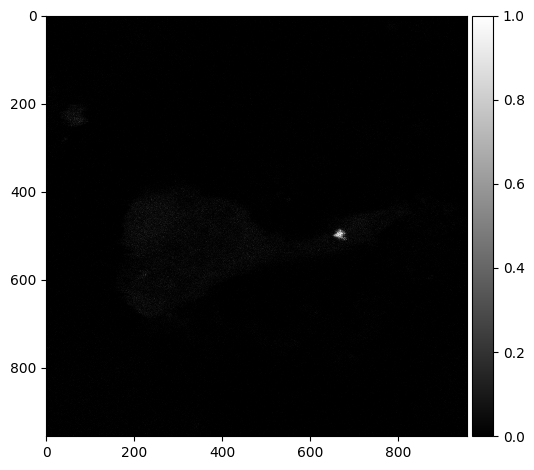

Segmented Cells


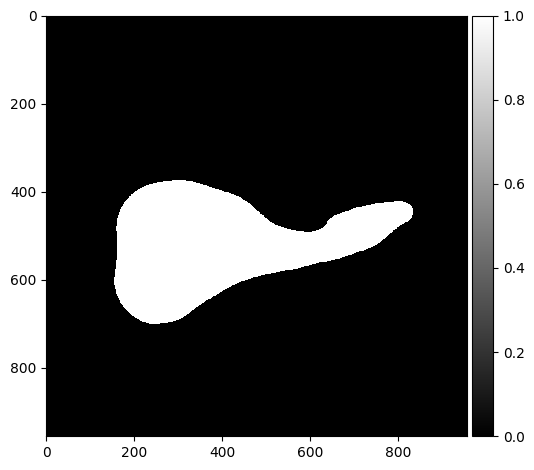

Threshold:  0.5
Bin count 873


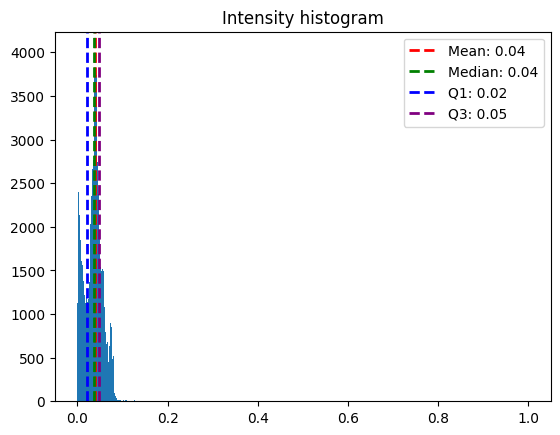

Inclusion Areas:  [201.]


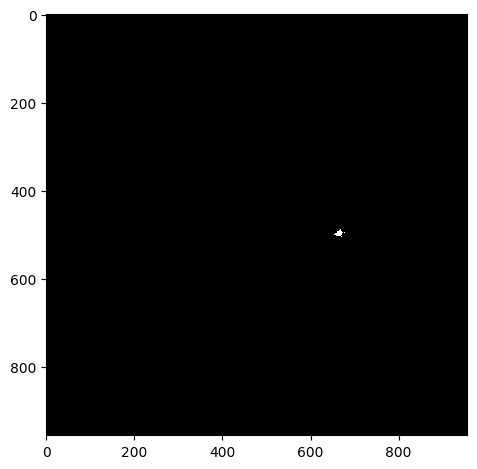

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_02.czi
Green Channel


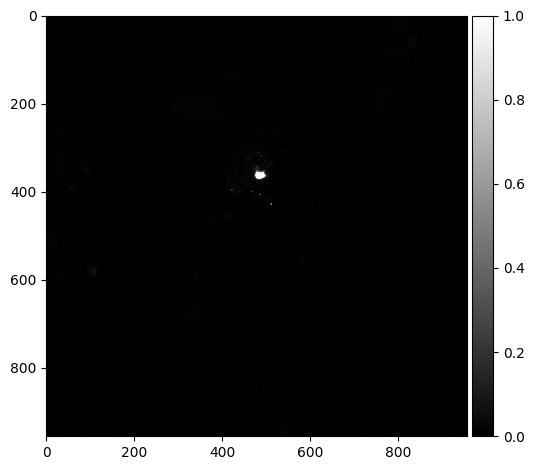

Segmented Cells


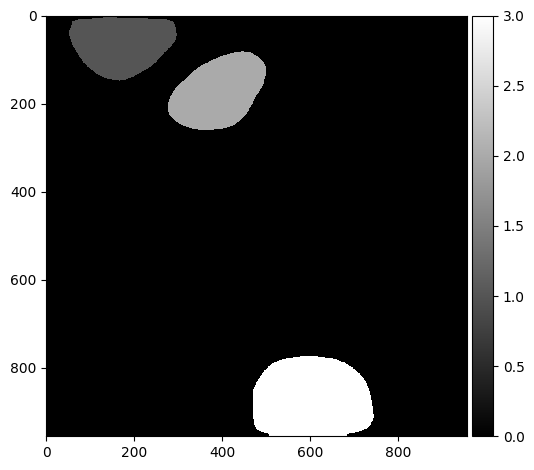

c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\yh1024\Documents\Yiming Huang\.venv\Lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_03.czi
Green Channel


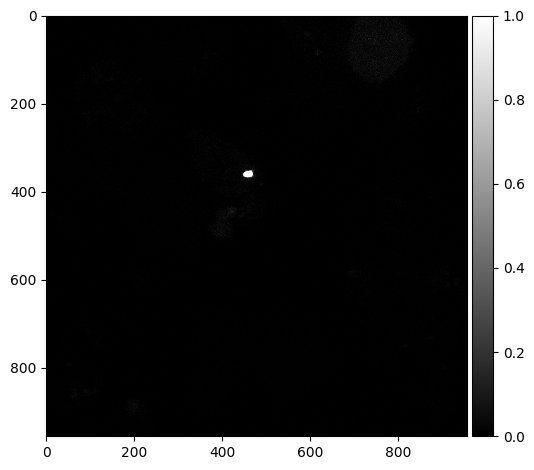

Segmented Cells


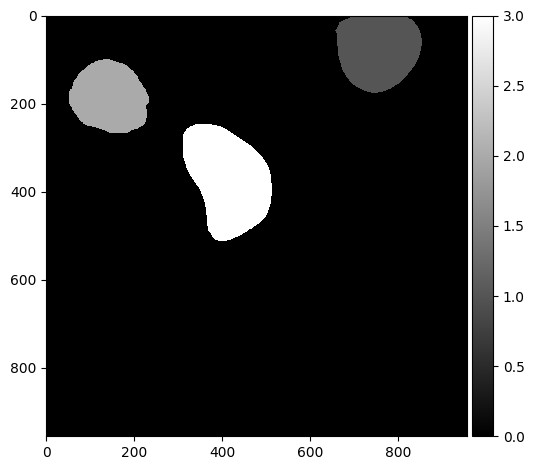

Threshold:  0.5
Bin count 1701


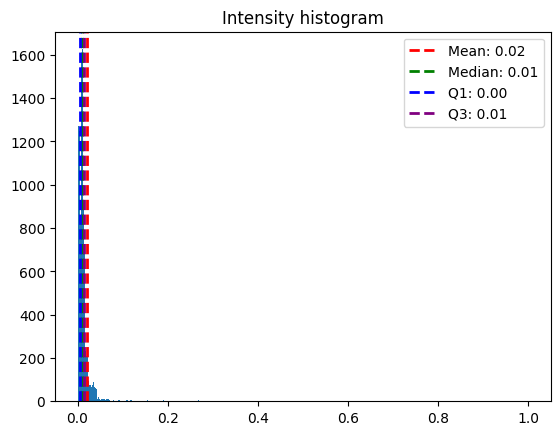

Inclusion Areas:  [286.]


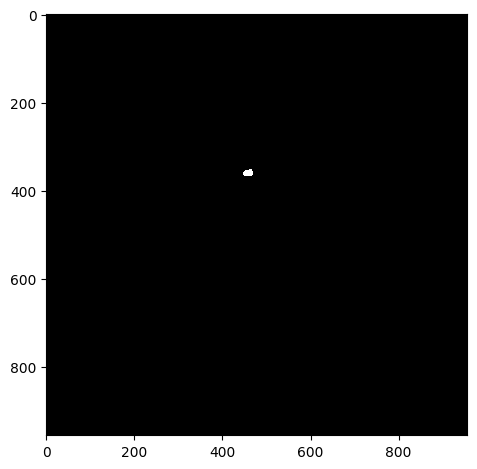

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_04.czi
Green Channel


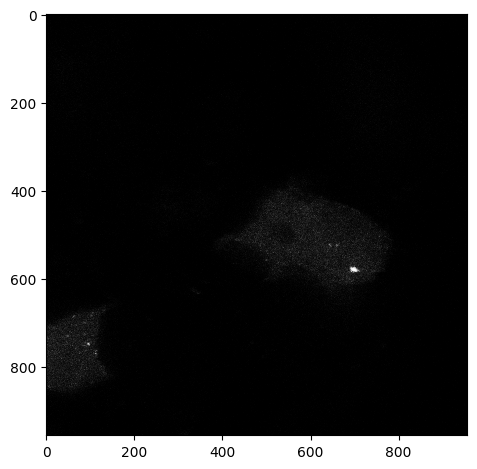

Segmented Cells


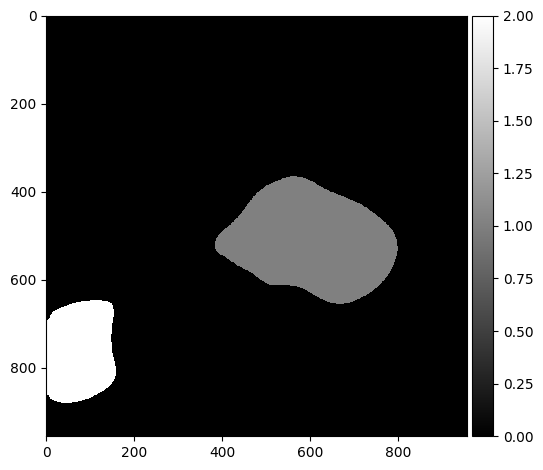

Threshold:  0.5
Bin count 213


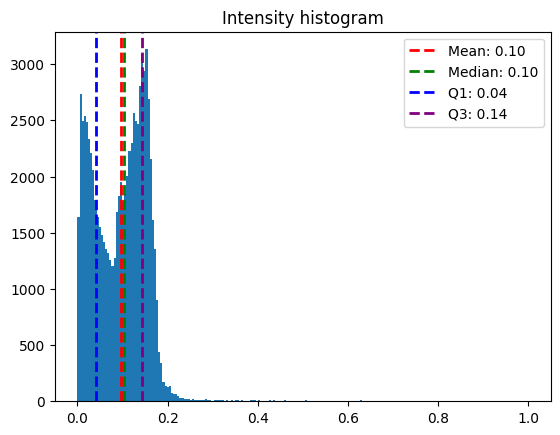

Inclusion Areas:  [154.]


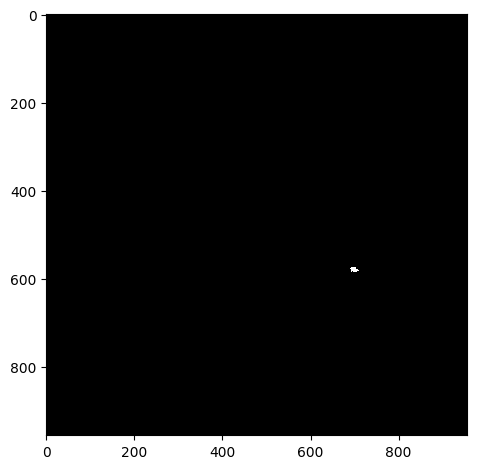

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_05.czi
Green Channel


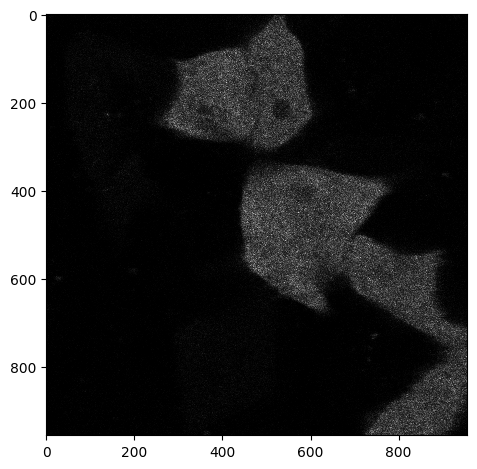

Segmented Cells


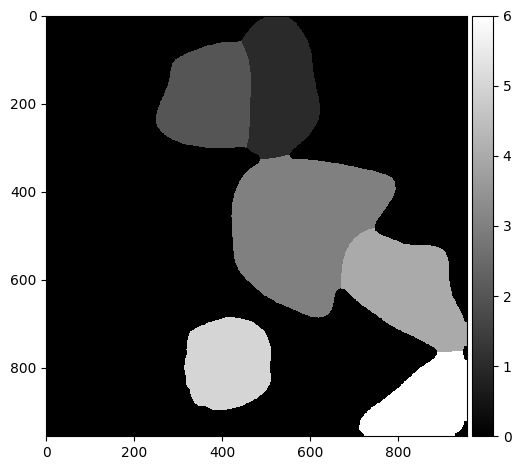

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_06.czi
Green Channel


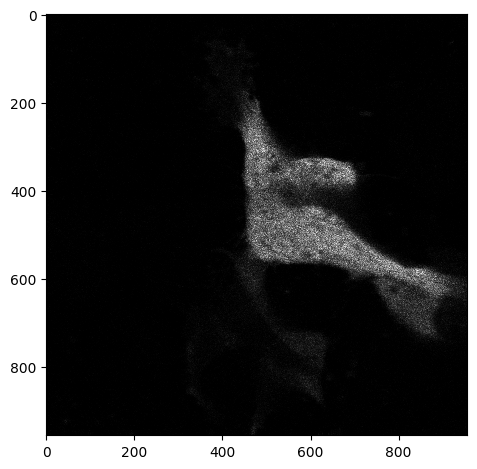

Segmented Cells


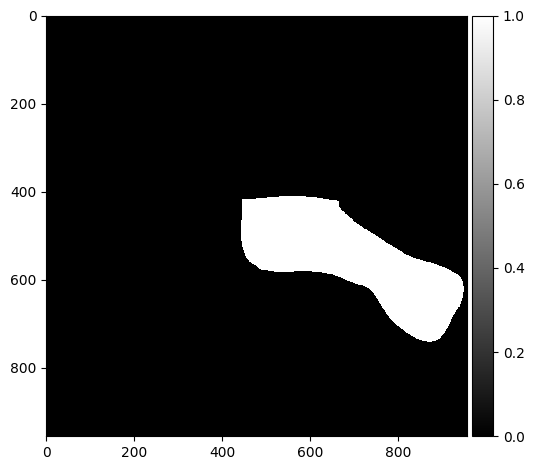

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_07.czi
Green Channel


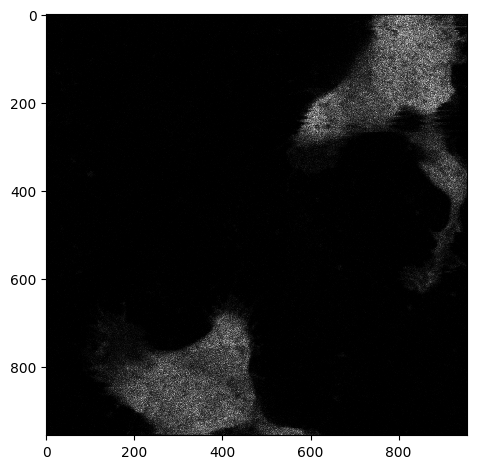

Segmented Cells


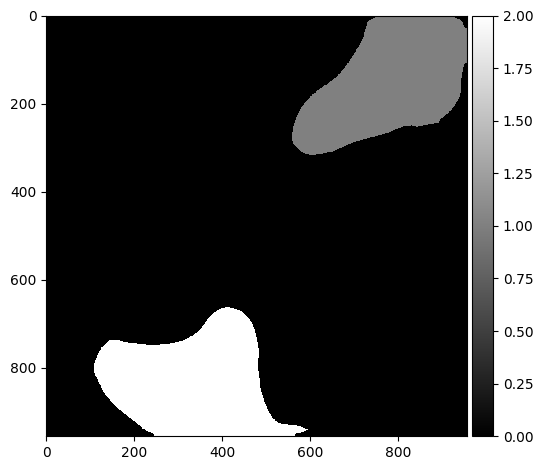

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_08.czi
Green Channel


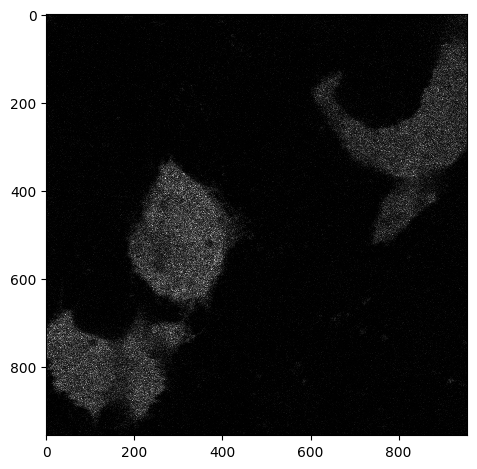

Segmented Cells


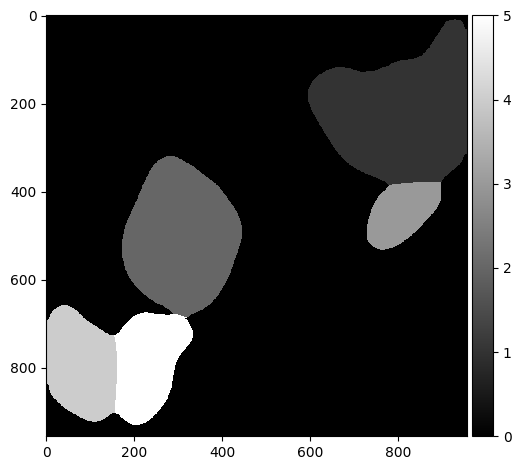

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_09.czi
Green Channel


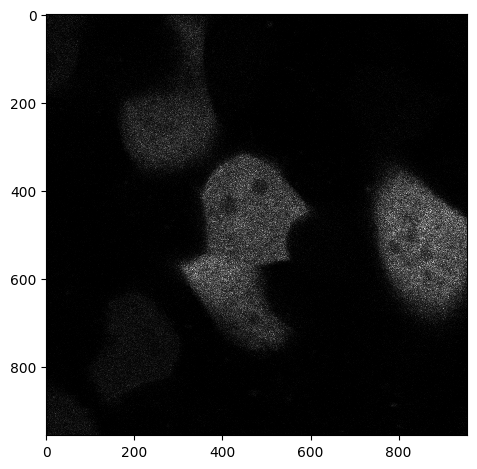

Segmented Cells


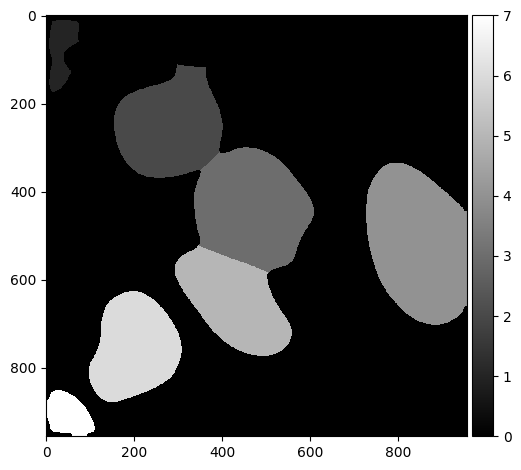

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_ADAMTS19_10.czi
Green Channel


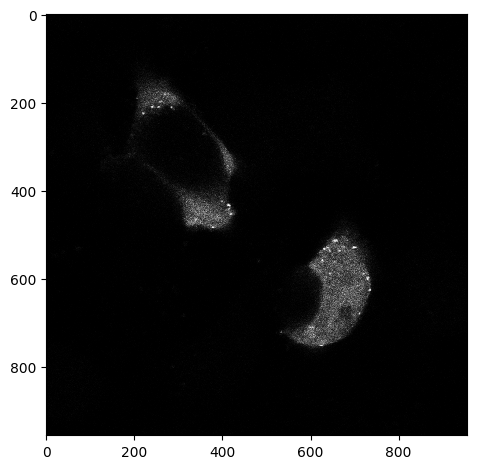

Segmented Cells


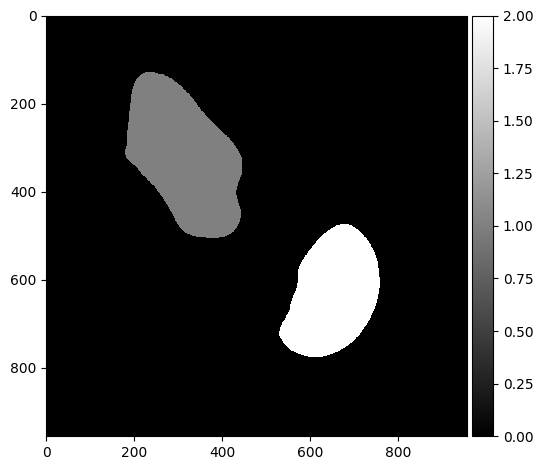

Threshold:  0.5
Bin count 95


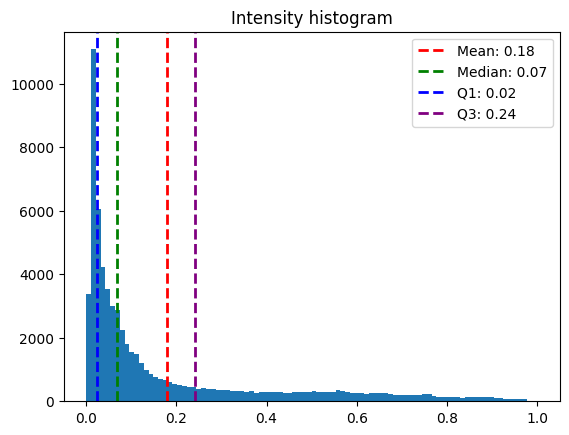

Inclusion Areas:  [21. 16. 22. 17. 21. 36. 27. 30. 32. 15. 15. 25.]


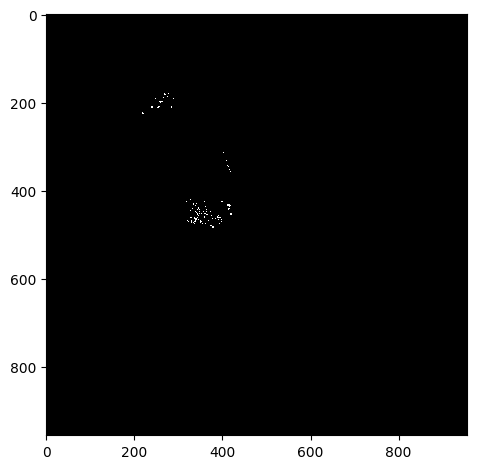

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_01.czi
Green Channel


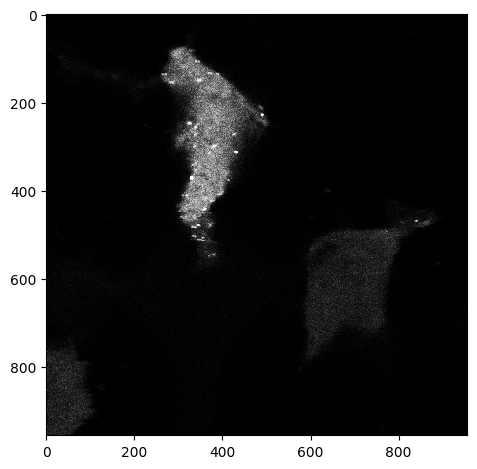

Segmented Cells


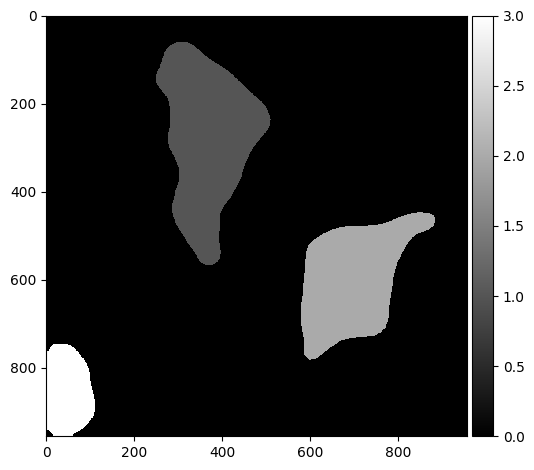

Threshold:  0.99
Bin count 39


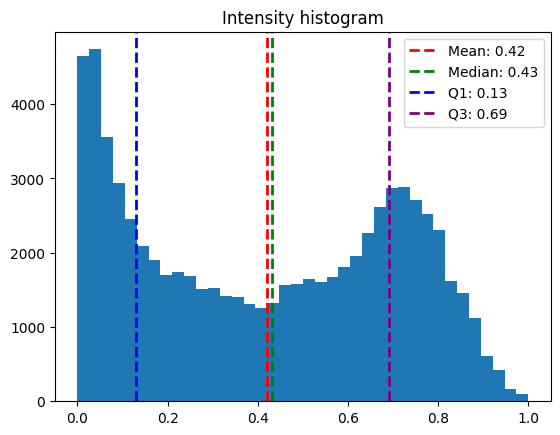

Inclusion Areas:  [14. 19.]


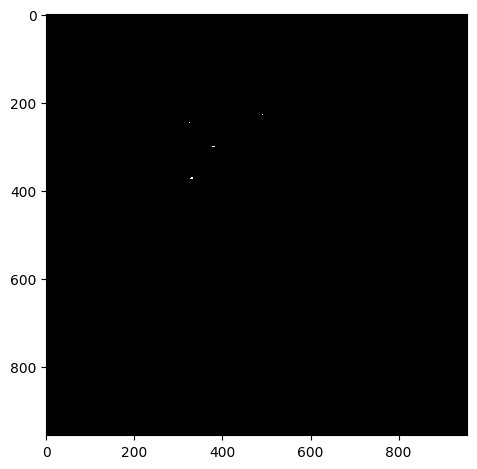

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_02.czi
Green Channel


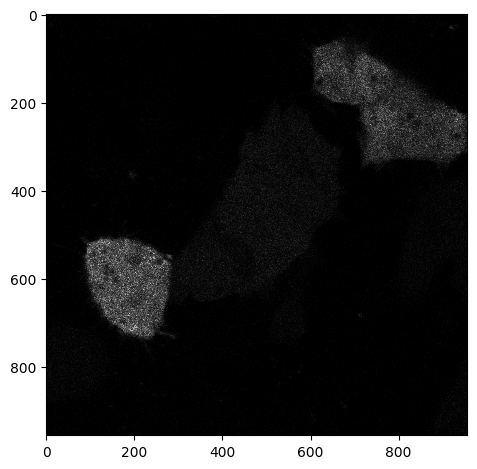

Segmented Cells


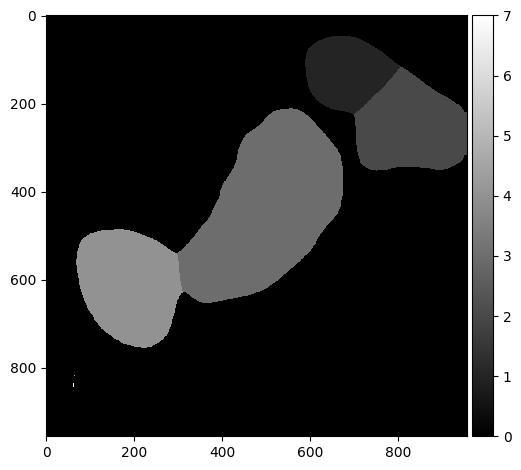

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_03.czi
Green Channel


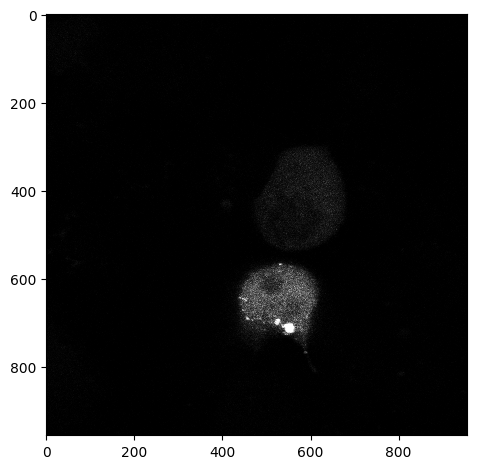

Segmented Cells


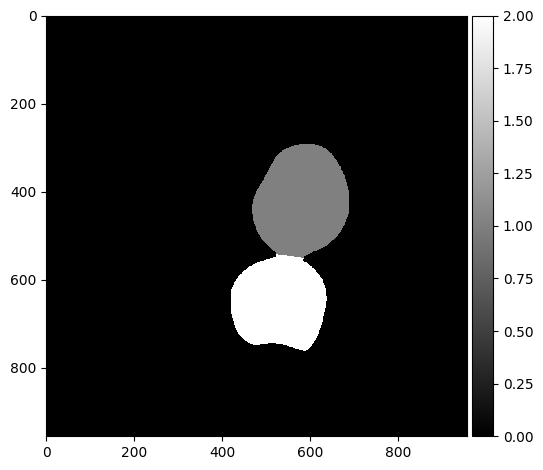

Threshold:  0.5
Bin count 64


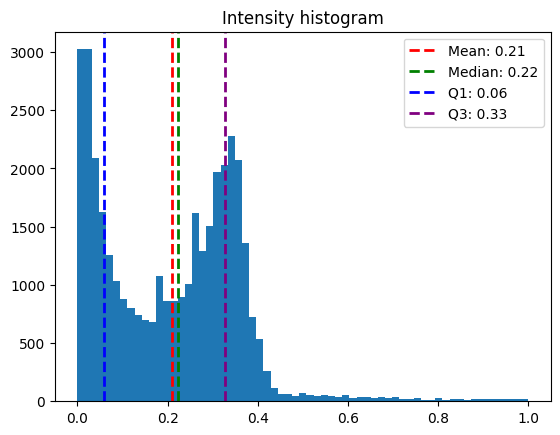

Inclusion Areas:  [ 15.  60.  13.  12.  29. 175. 553.  12.]


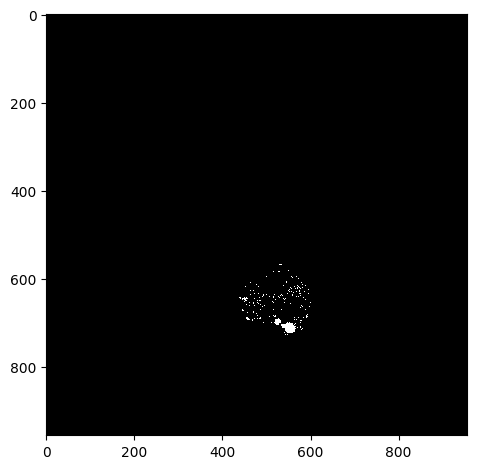

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_04.czi
Green Channel


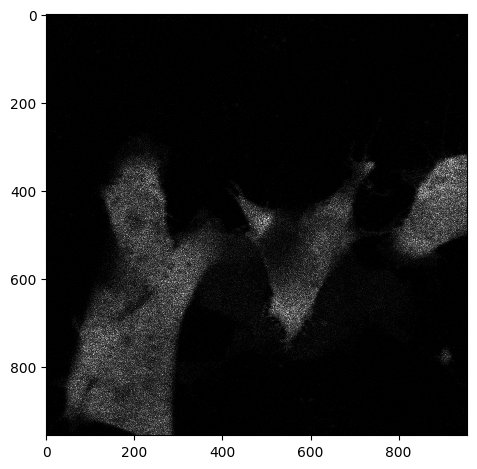

Segmented Cells


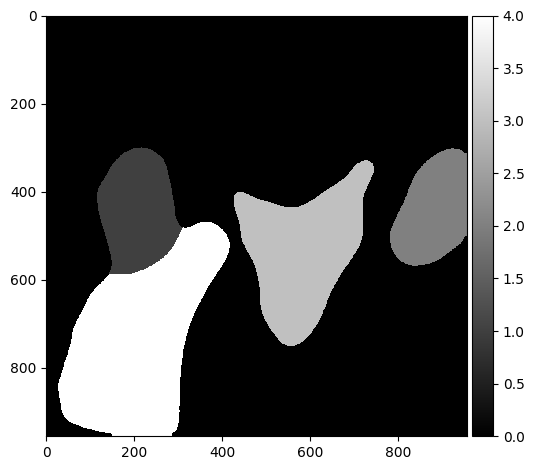

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_05.czi
Green Channel


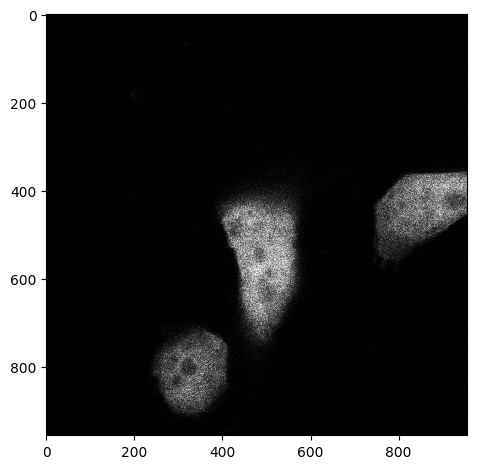

Segmented Cells


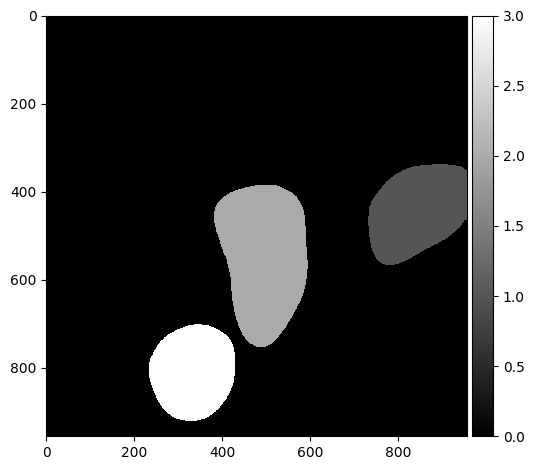

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_06.czi
Green Channel


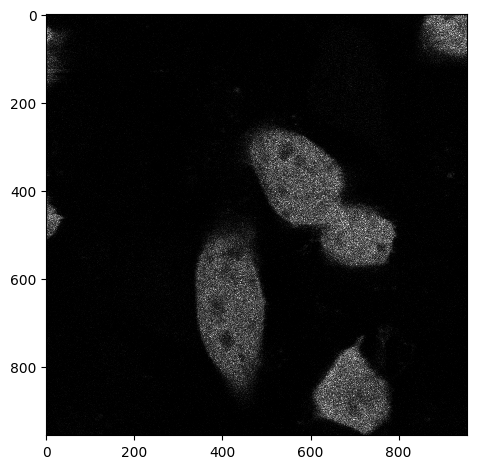

Segmented Cells


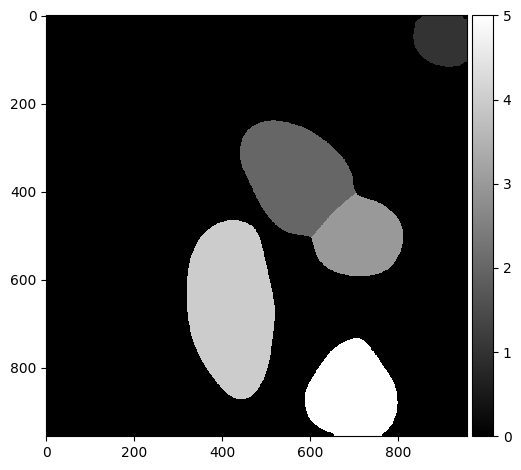

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_07.czi
Green Channel


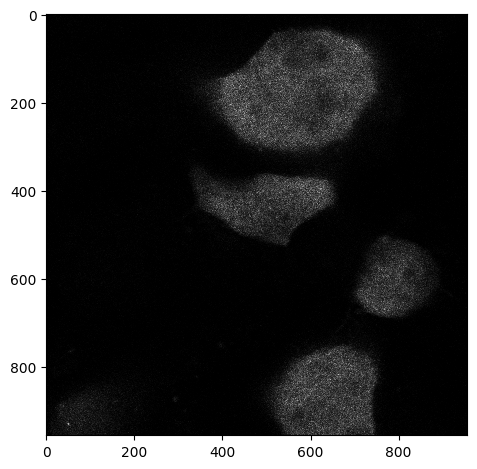

Segmented Cells


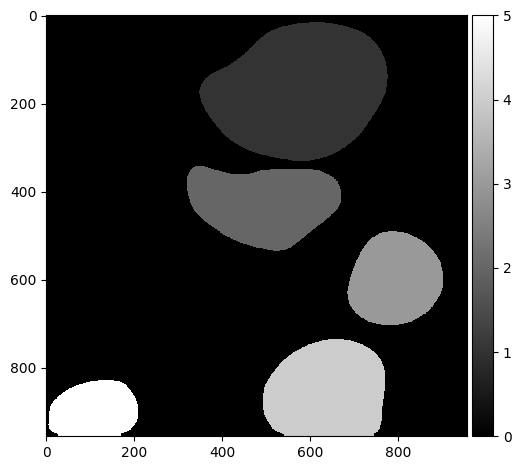

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_08.czi
Green Channel


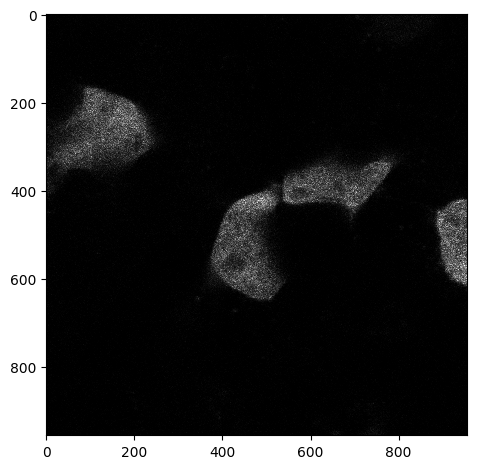

Segmented Cells


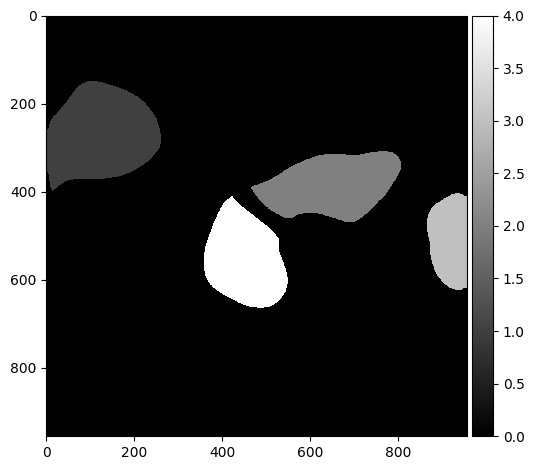

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_09.czi
Green Channel


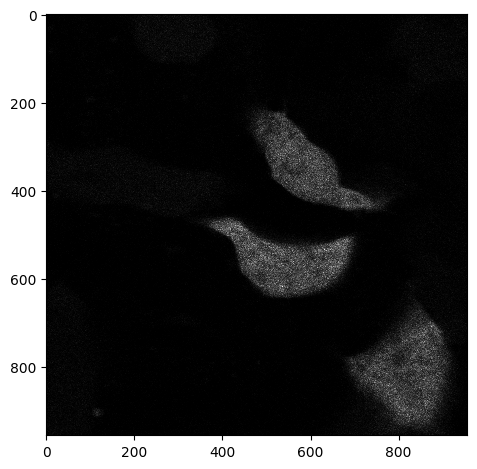

Segmented Cells


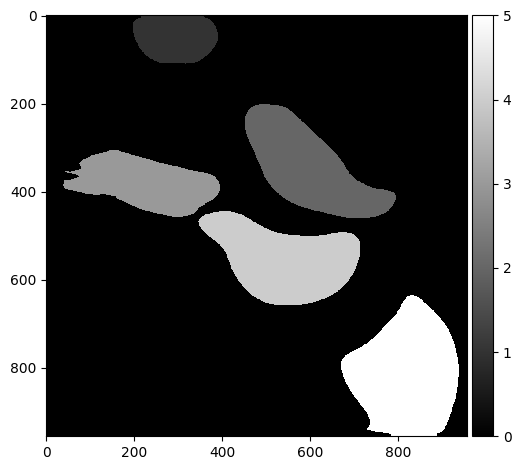

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_SCR_10.czi
Green Channel


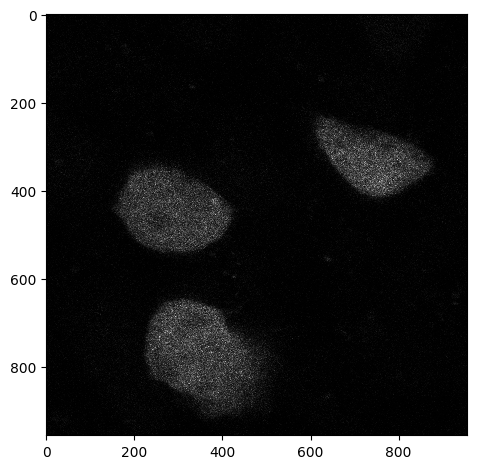

Segmented Cells


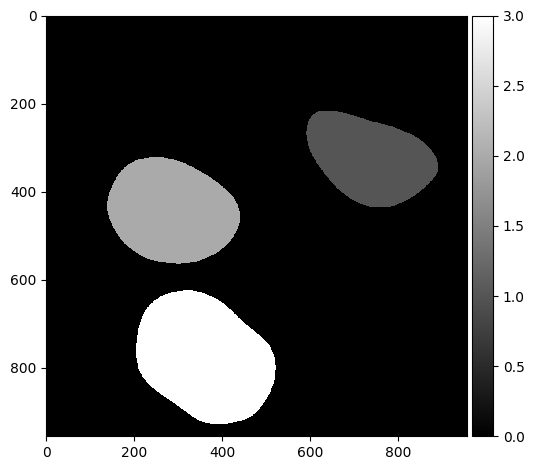

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_01.czi
Green Channel


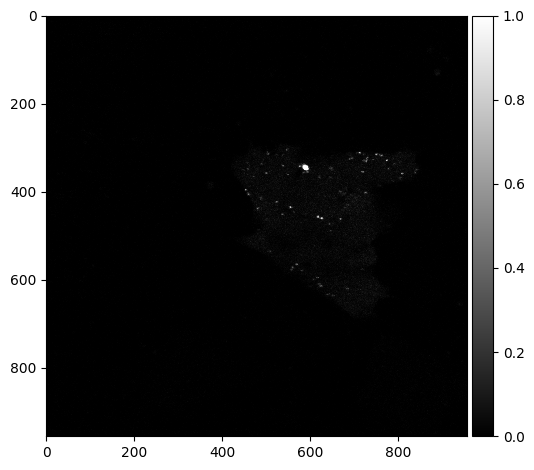

Segmented Cells


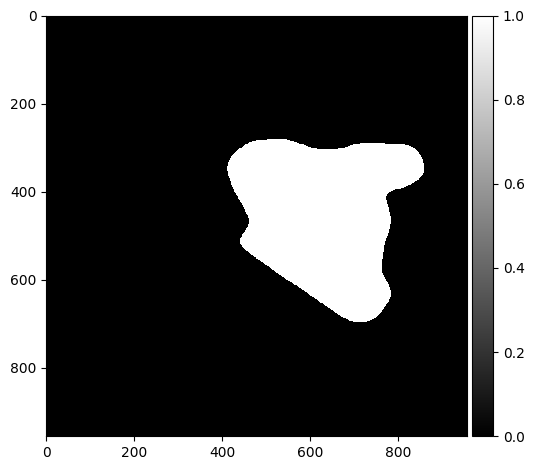

Threshold:  0.5
Bin count 827


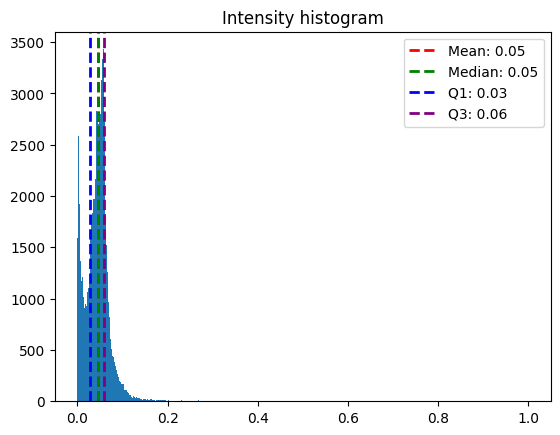

Inclusion Areas:  [151.  16.  14.  18.]


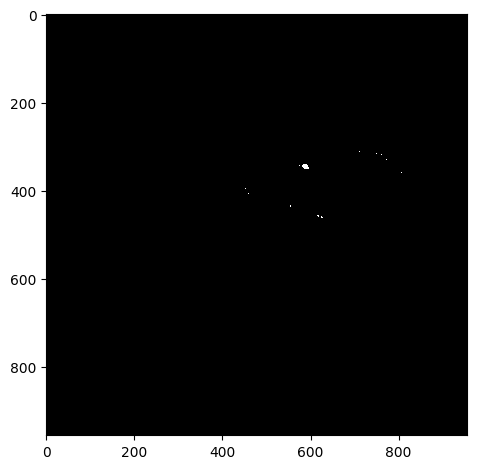

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_02.czi
Green Channel


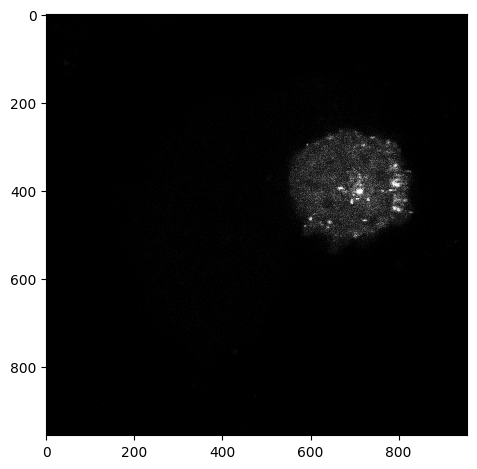

Segmented Cells


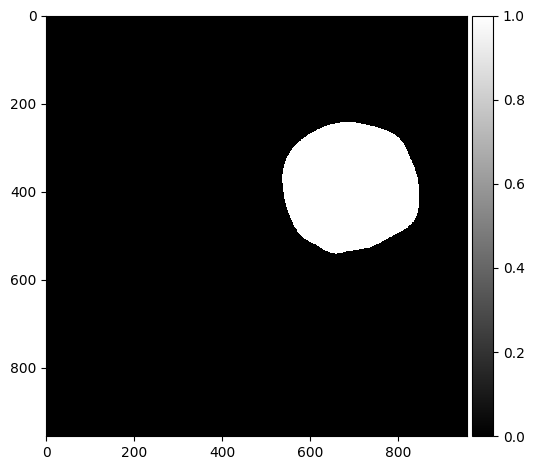

Threshold:  0.5
Bin count 133


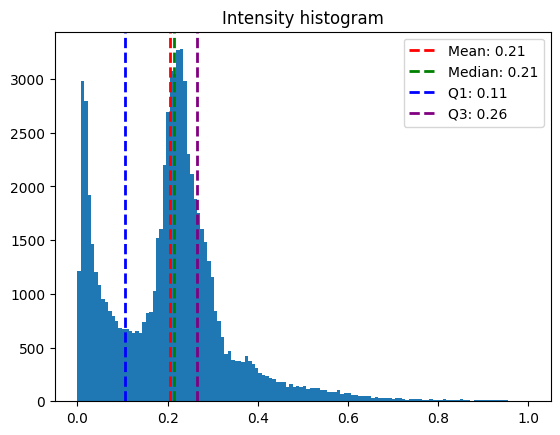

Inclusion Areas:  [ 11.  22.  83.  16. 125. 307.  89. 241.  41.  24.  19.  34.  15.  49.
  36.  32.  62.  20.  19. 144.  36.  29.  44.  12.  20.]


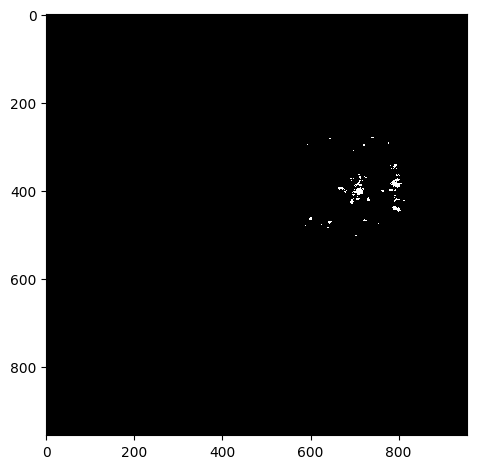

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_04.czi
Green Channel


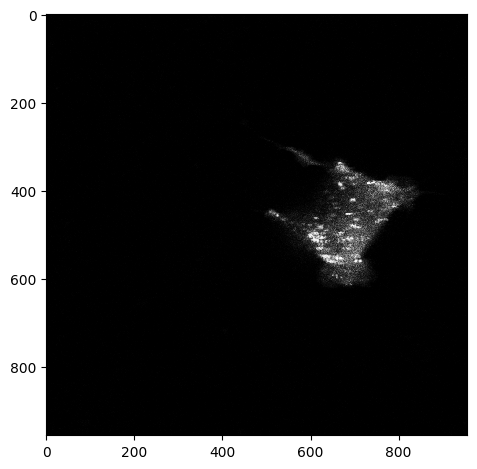

Segmented Cells


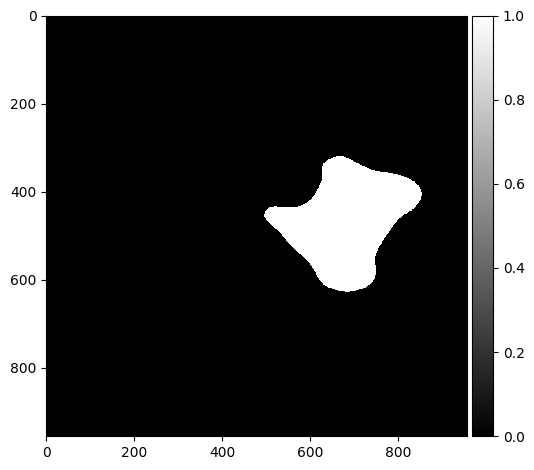

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_05.czi
Green Channel


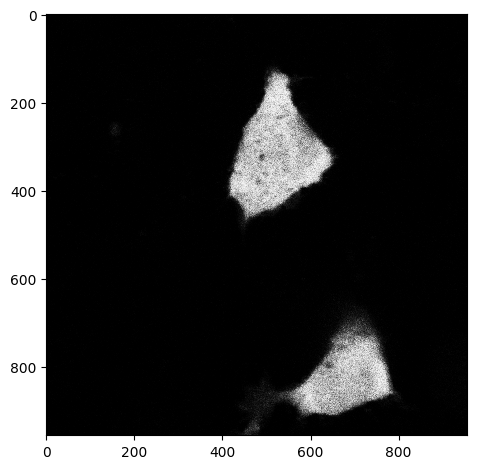

Segmented Cells


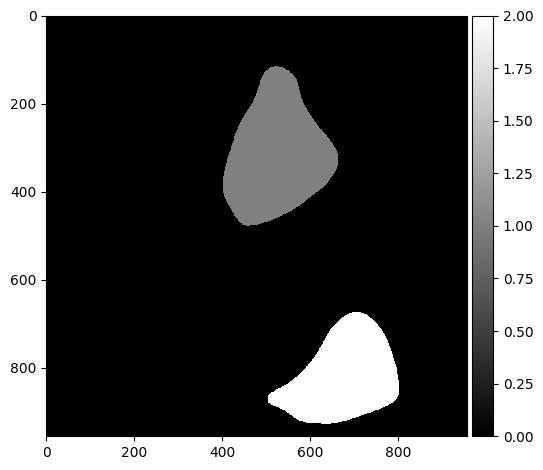

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_06.czi
Green Channel


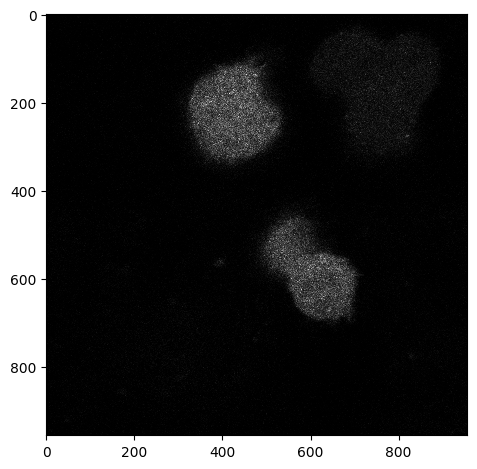

Segmented Cells


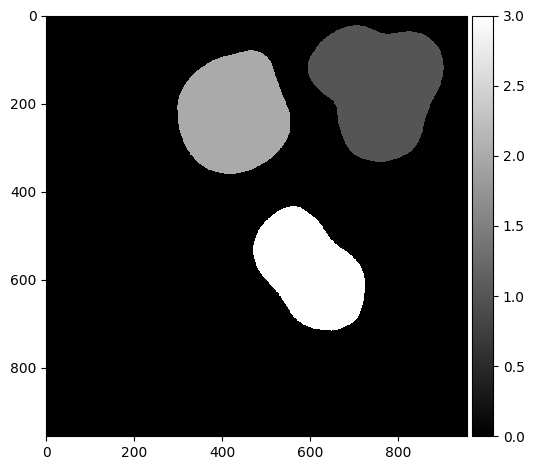

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_07.czi
Green Channel


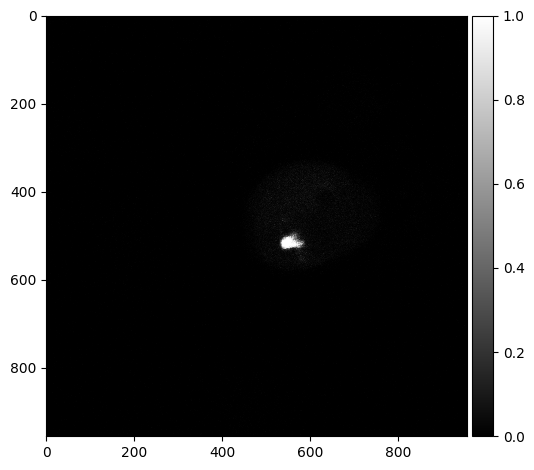

Segmented Cells


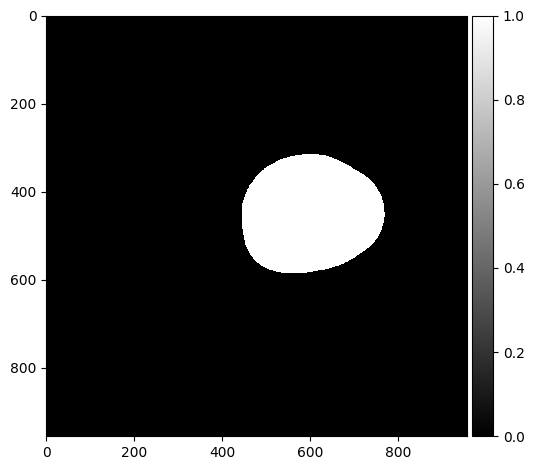

Threshold:  0.5
Bin count 1063


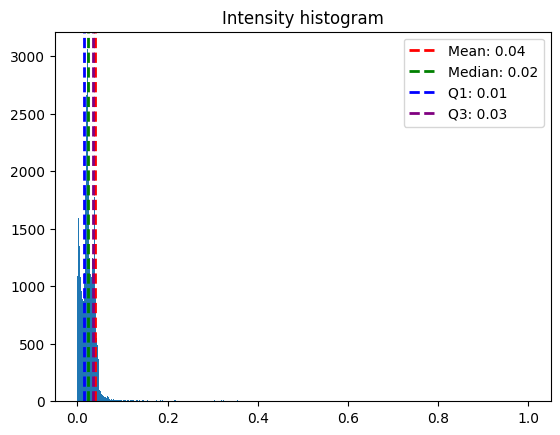

Inclusion Areas:  [994.]


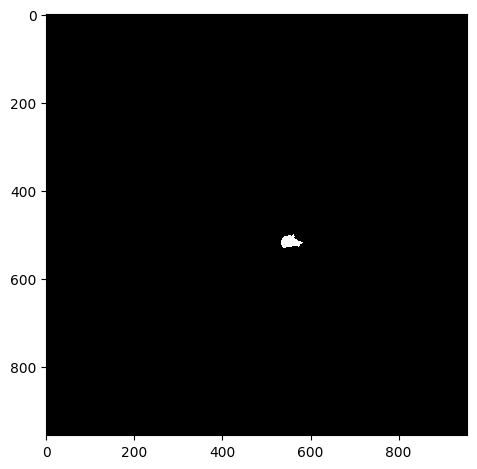

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_08.czi
Green Channel


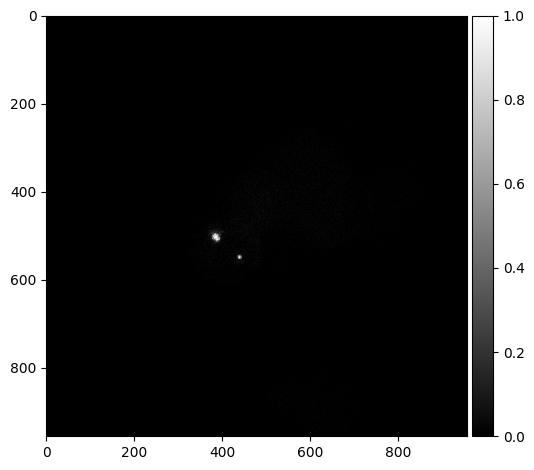

Segmented Cells


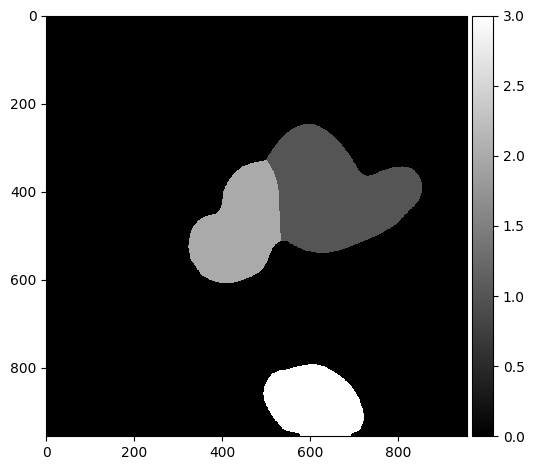

Threshold:  0.5
Bin count 1078


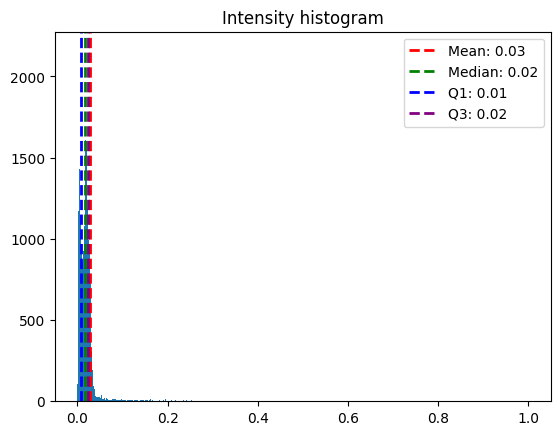

Inclusion Areas:  [189.  34.]


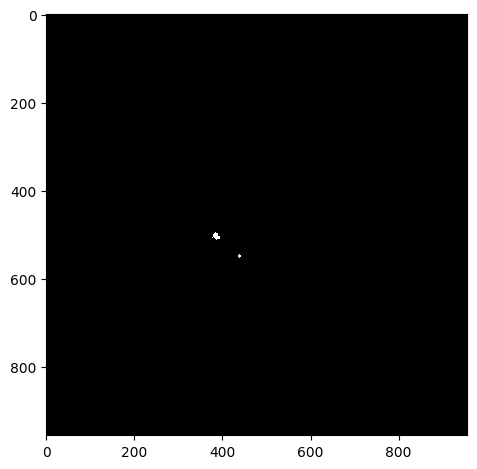

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_09.czi
Green Channel


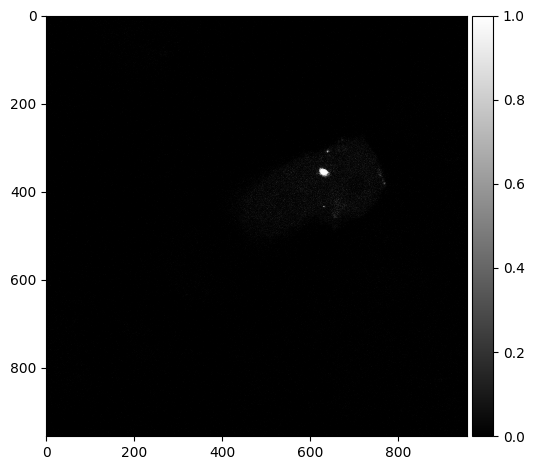

Segmented Cells


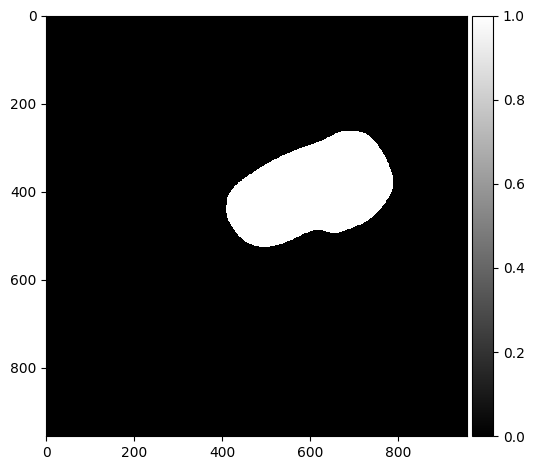

Threshold:  0.5
Bin count 636


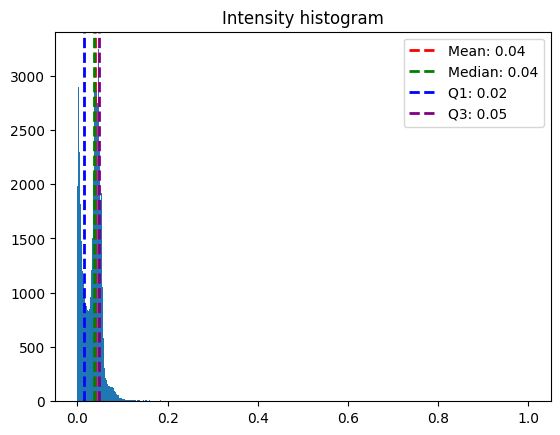

Inclusion Areas:  [257.]


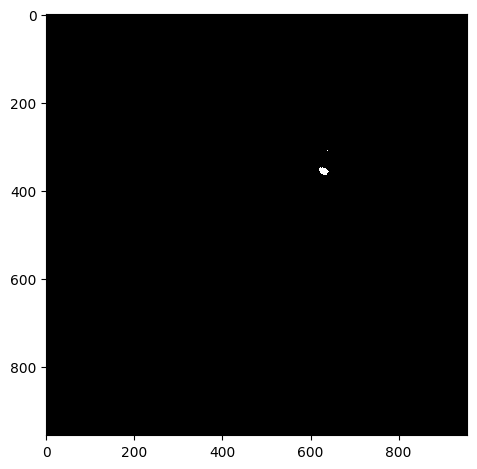

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1K_TAX1BP1_10.czi
Green Channel


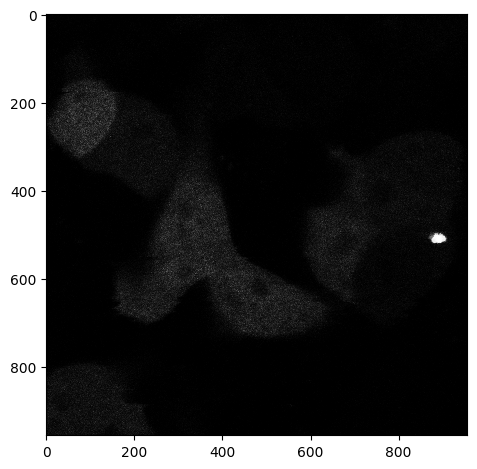

Segmented Cells


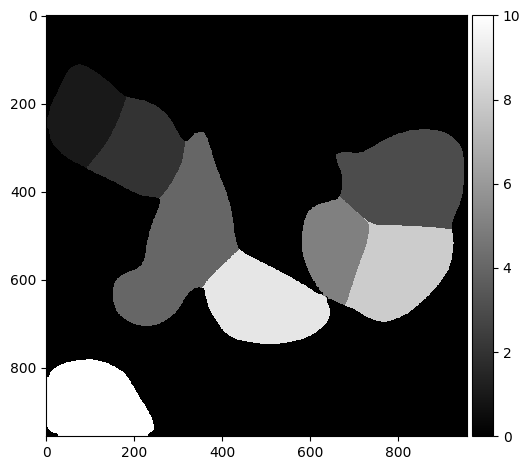

Threshold:  0.5
Bin count 1874


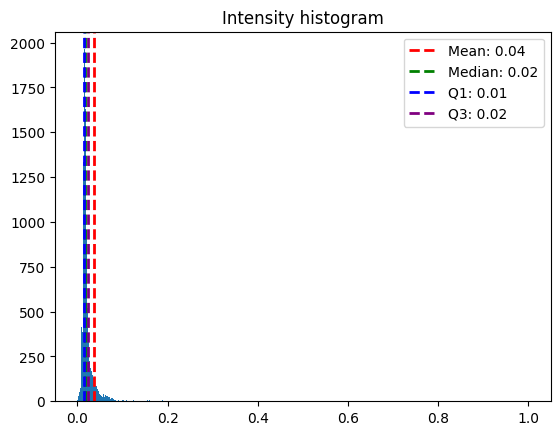

Inclusion Areas:  [580.]


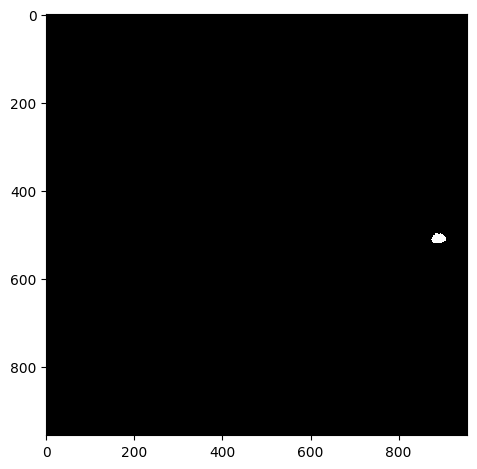

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_01.czi
Green Channel


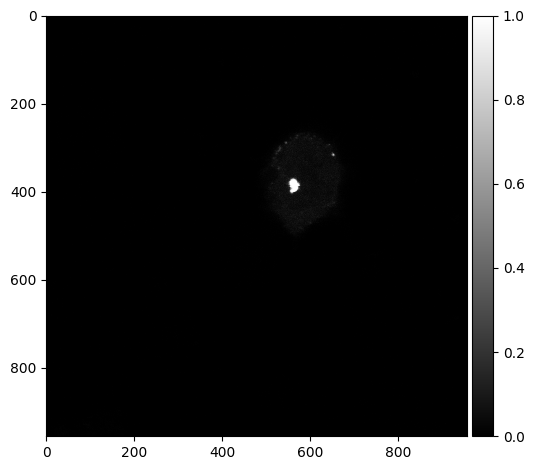

Segmented Cells


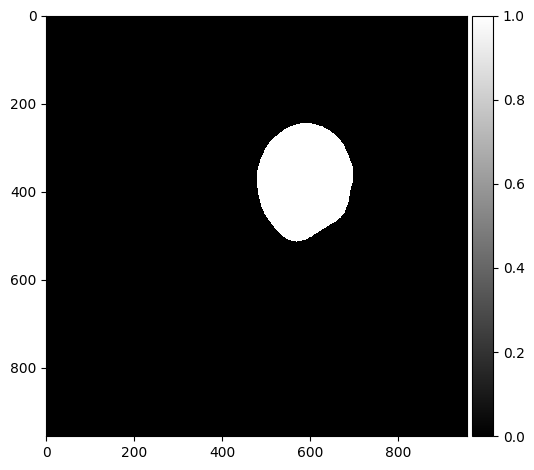

Threshold:  0.5
Bin count 426


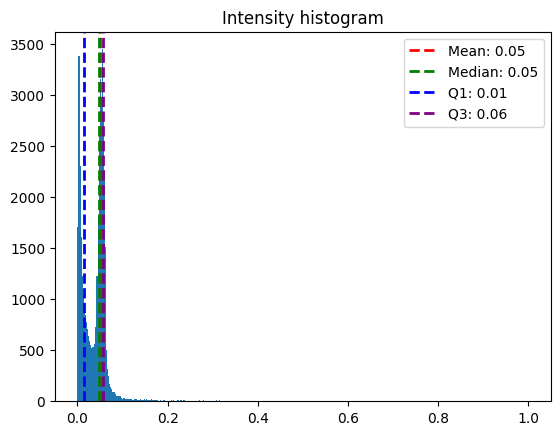

Inclusion Areas:  [ 16. 559.]


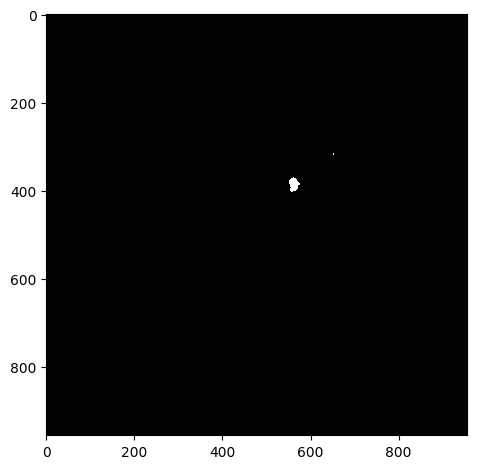

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_02.czi
Green Channel


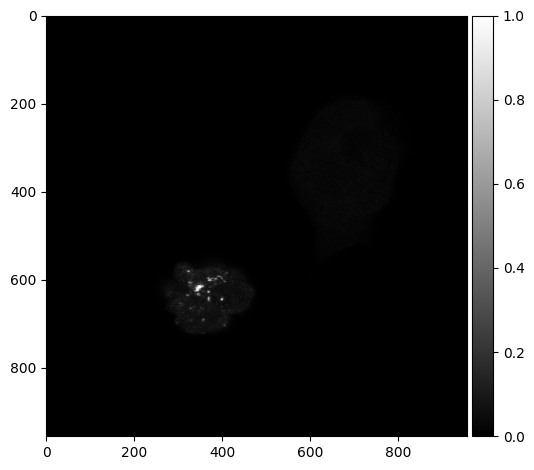

Segmented Cells


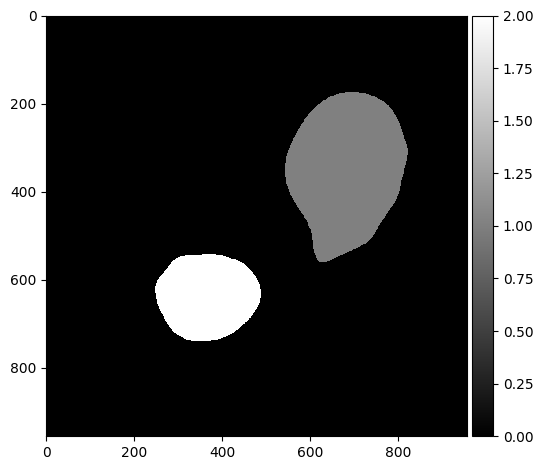

Threshold:  0.5
Bin count 167


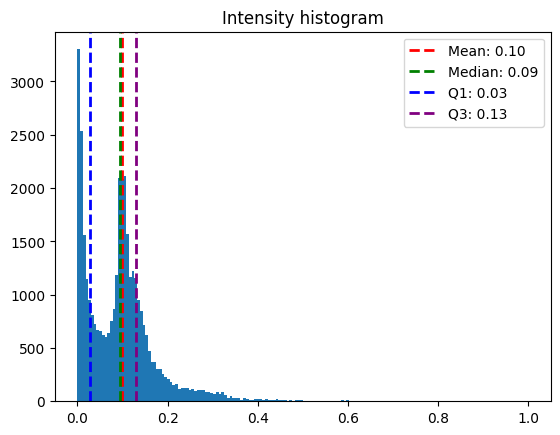

Inclusion Areas:  [ 24. 156.  15.  14.  18.]


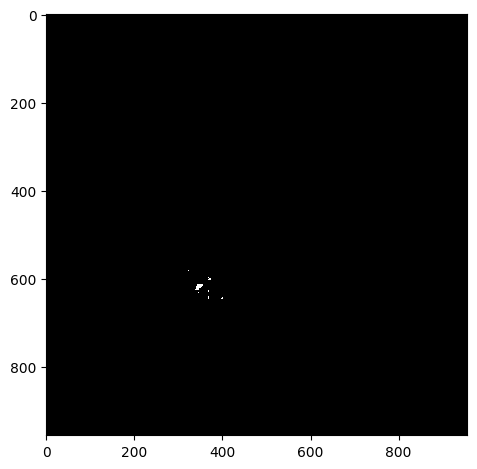

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_03.czi
Green Channel


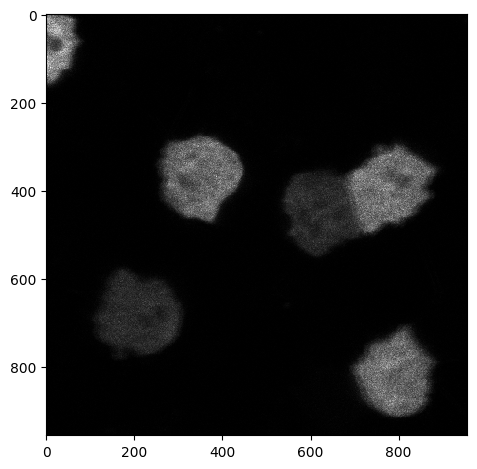

Segmented Cells


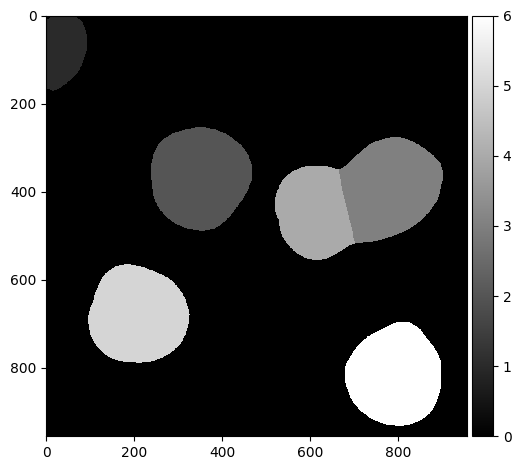

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_04.czi
Green Channel


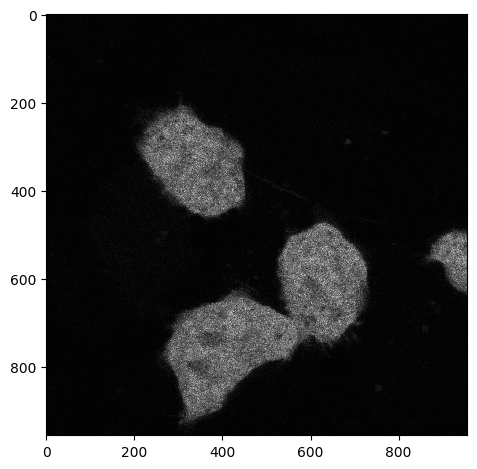

Segmented Cells


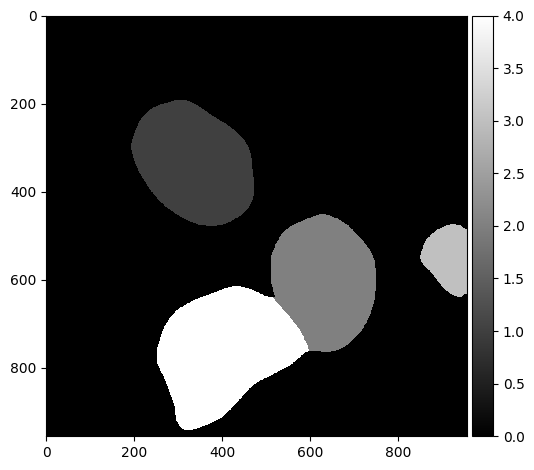

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_05.czi
Green Channel


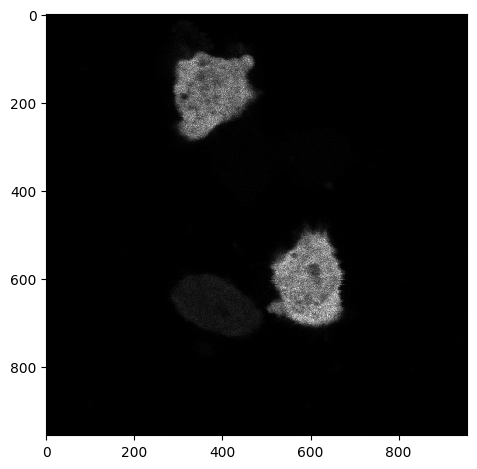

Segmented Cells


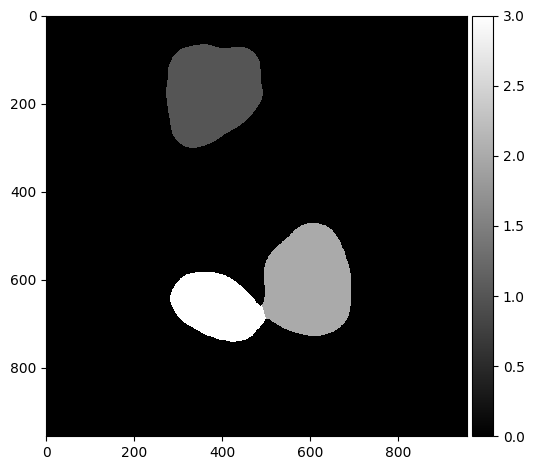

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_06.czi
Green Channel


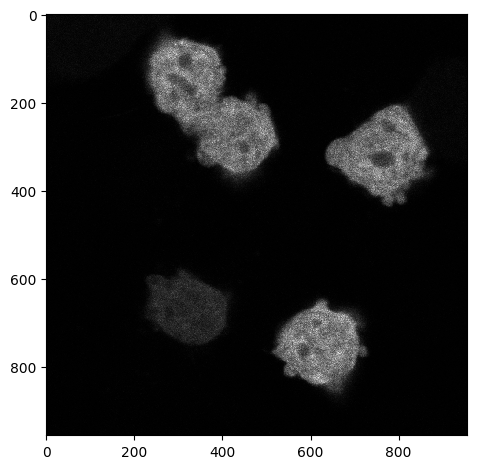

Segmented Cells


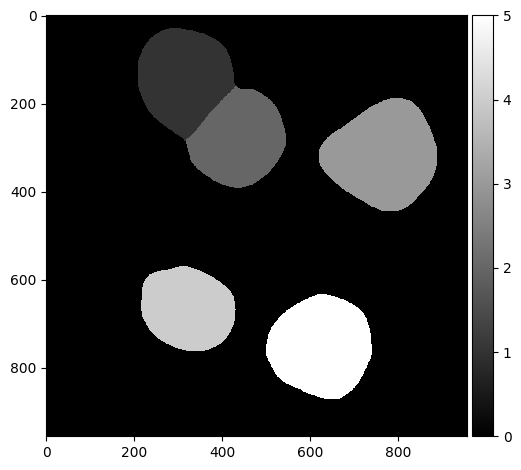

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_07.czi
Green Channel


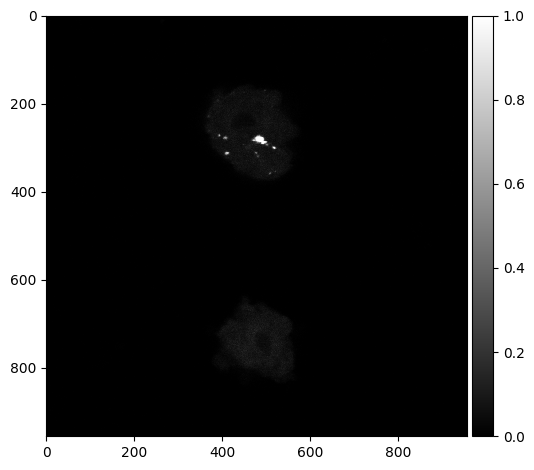

Segmented Cells


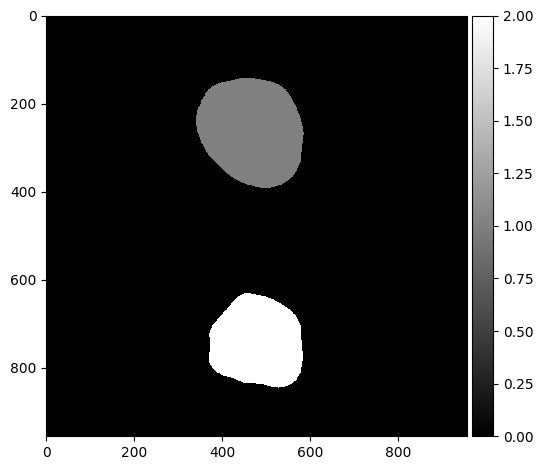

Threshold:  0.5
Bin count 312


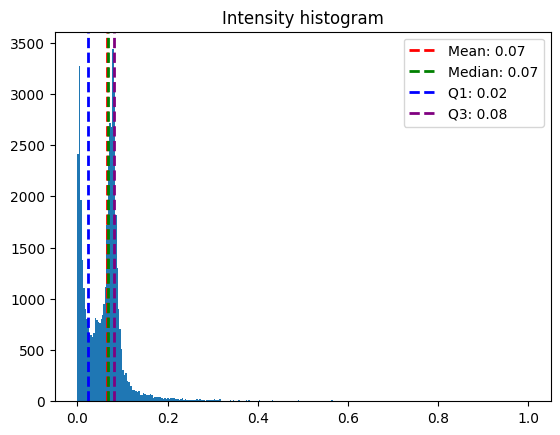

Inclusion Areas:  [349.  18.  34.  35.]


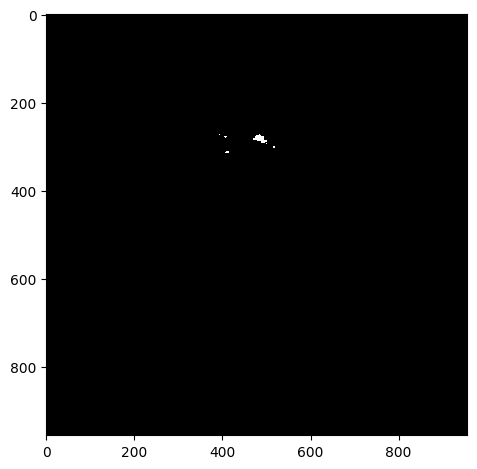

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_08.czi
Green Channel


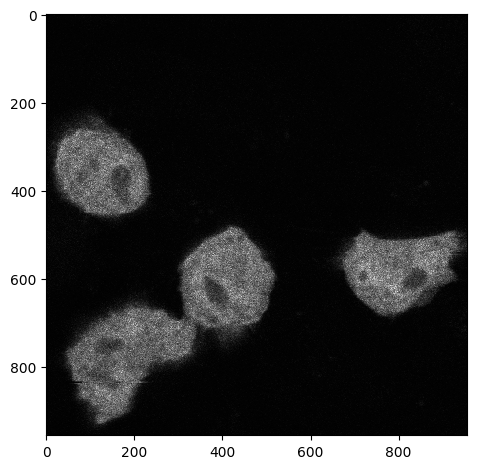

Segmented Cells


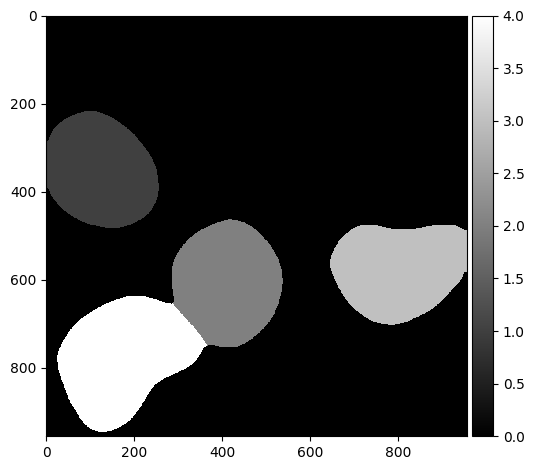

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_09.czi
Green Channel


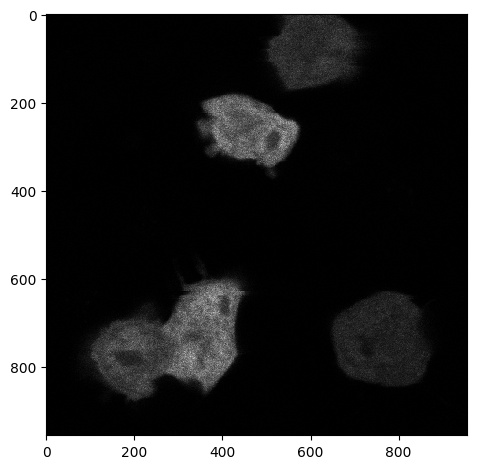

Segmented Cells


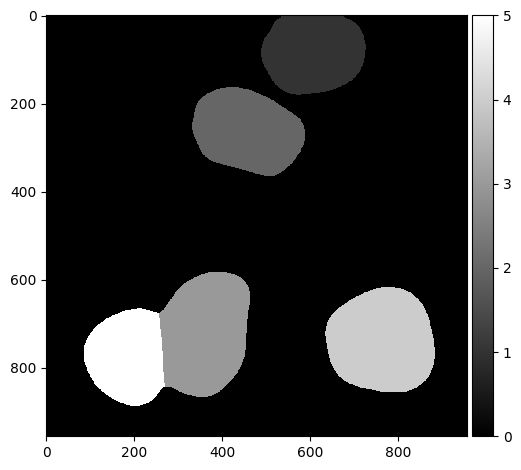

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_ADAMTS19_10.czi
Green Channel


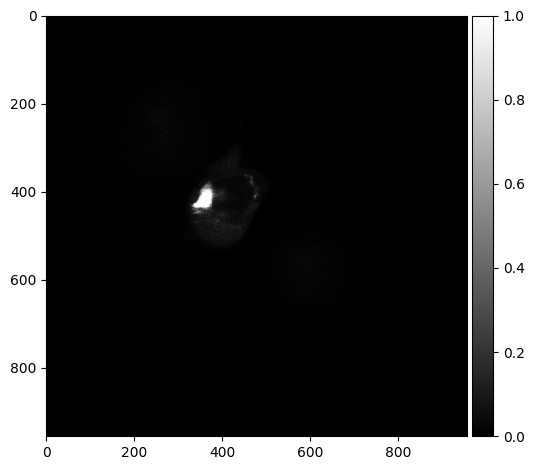

Segmented Cells


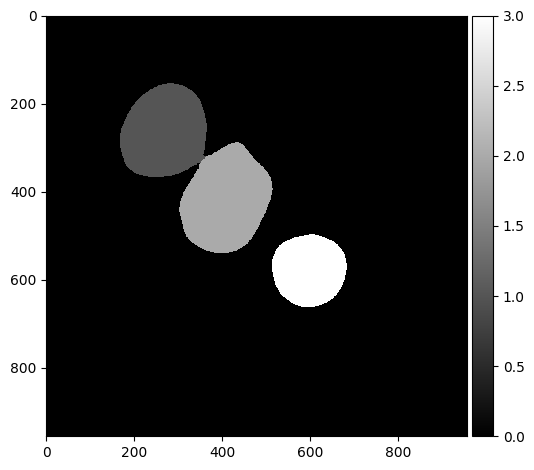

Threshold:  0.5
Bin count 308


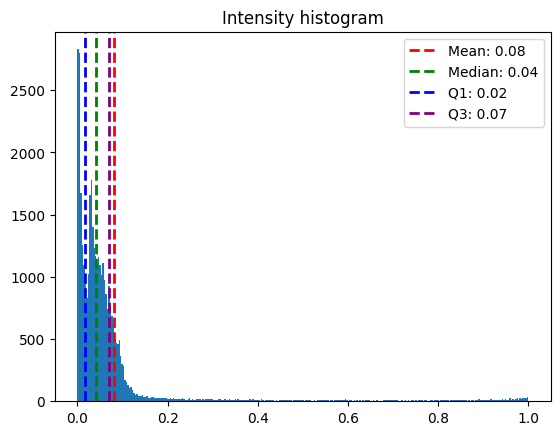

Inclusion Areas:  [1472.]


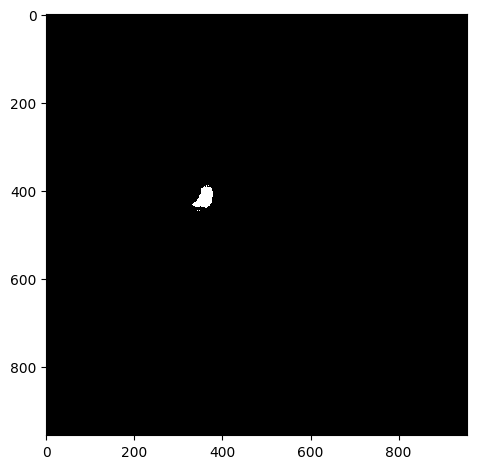

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_01.czi
Green Channel


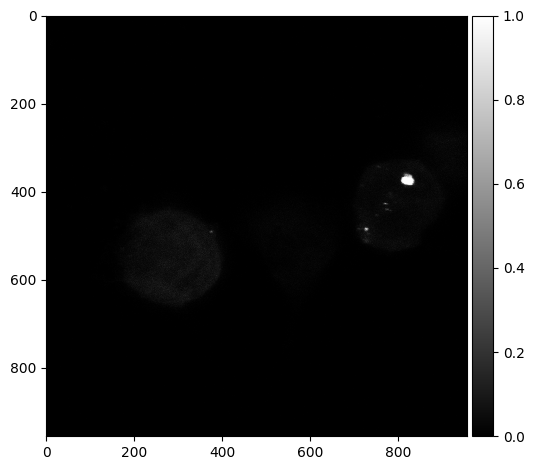

Segmented Cells


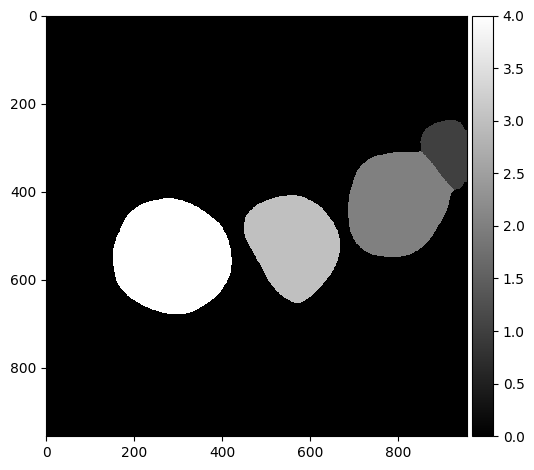

Threshold:  0.5
Bin count 1113


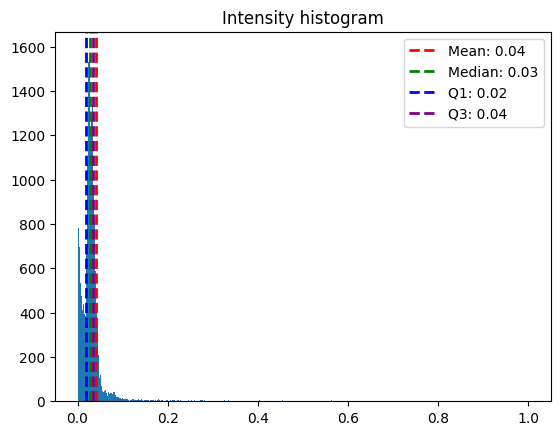

Inclusion Areas:  [519.  33.]


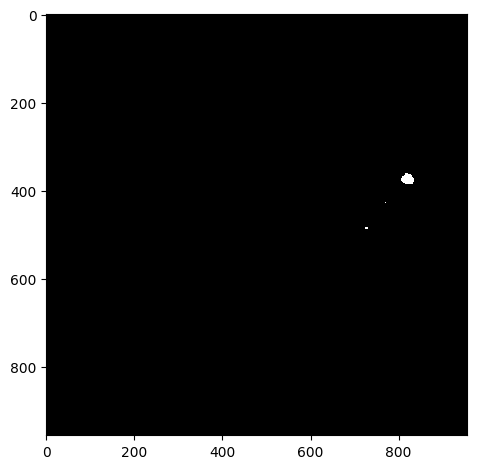

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_02.czi
Green Channel


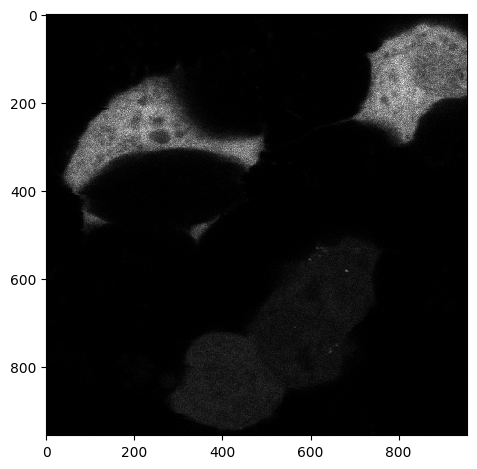

Segmented Cells


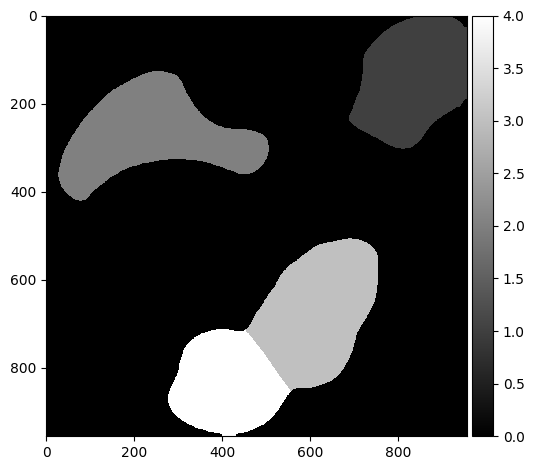

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_03.czi
Green Channel


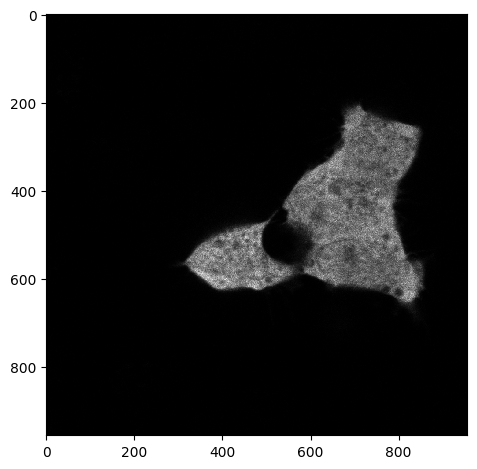

Segmented Cells


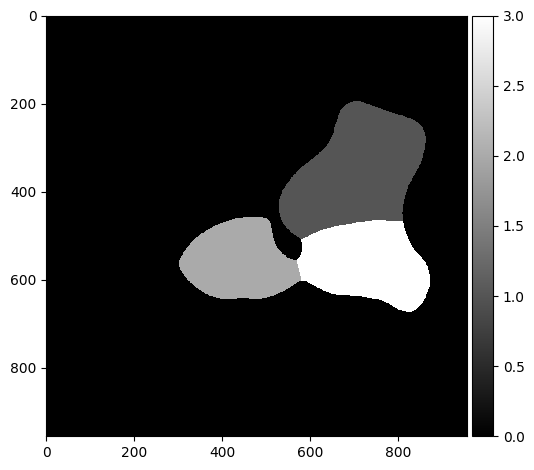

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_04.czi
Green Channel


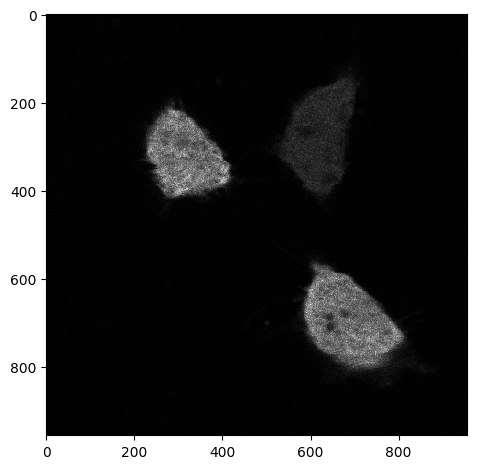

Segmented Cells


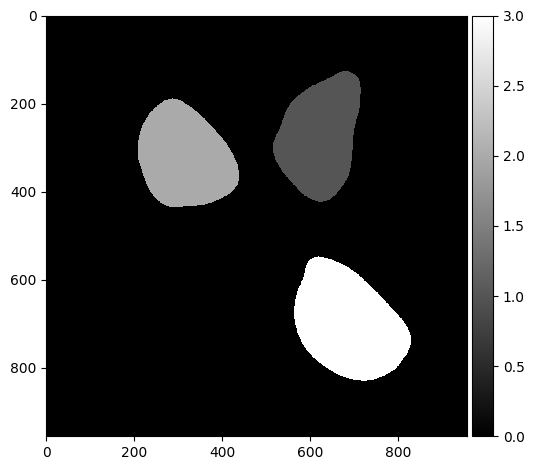

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_05.czi
Green Channel


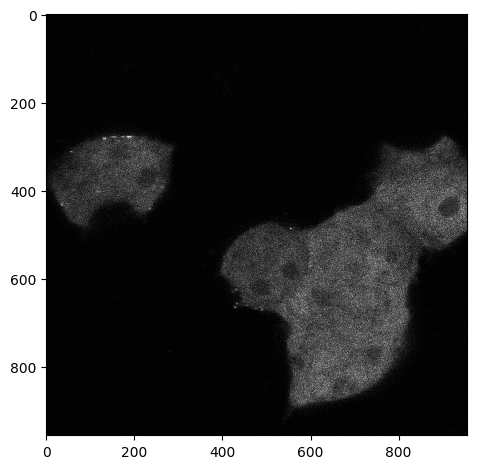

Segmented Cells


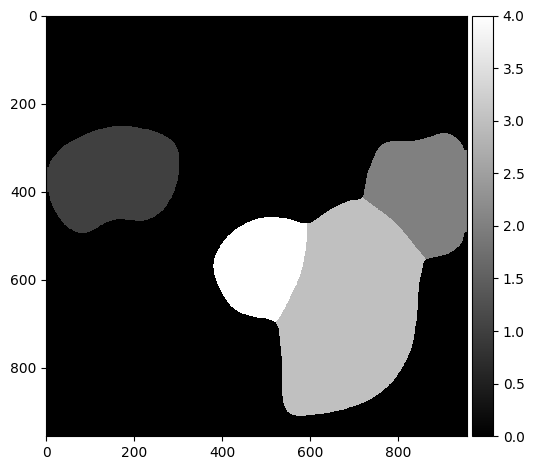

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_06.czi
Green Channel


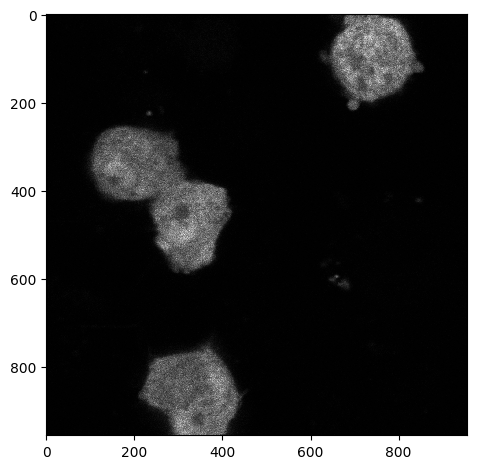

Segmented Cells


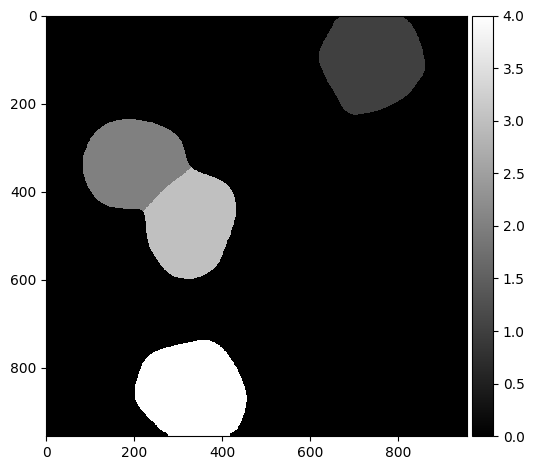

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_07.czi
Green Channel


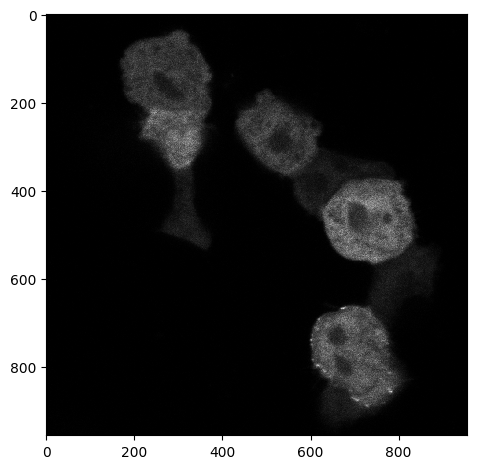

Segmented Cells


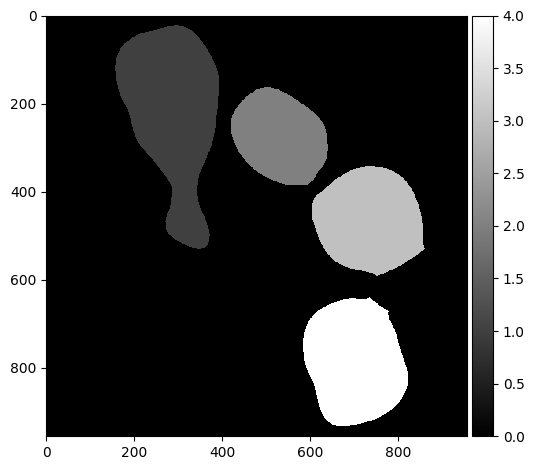

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_08.czi
Green Channel


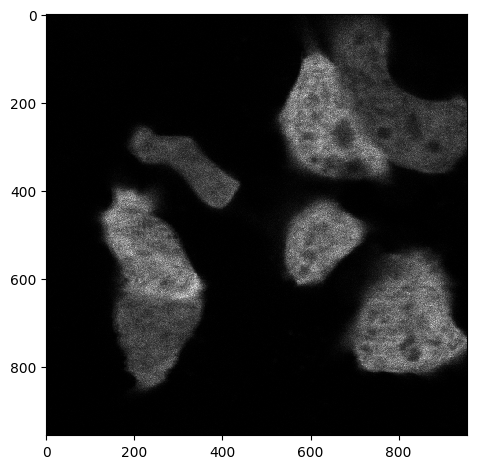

Segmented Cells


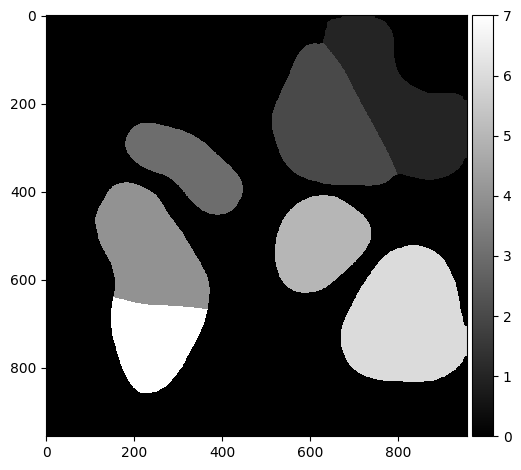

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_09.czi
Green Channel


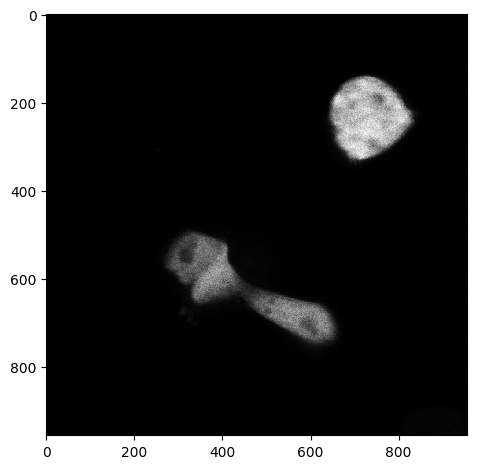

Segmented Cells


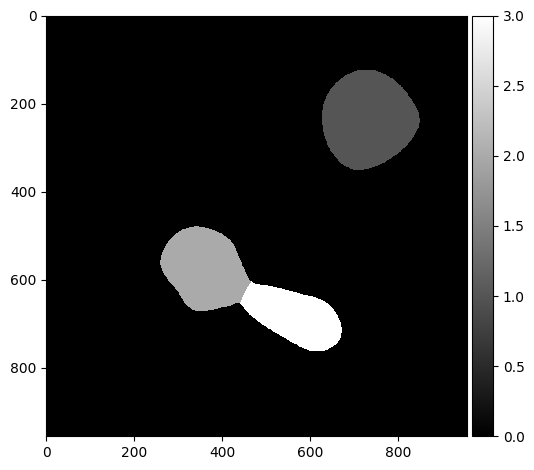

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_SCR_10.czi
Green Channel


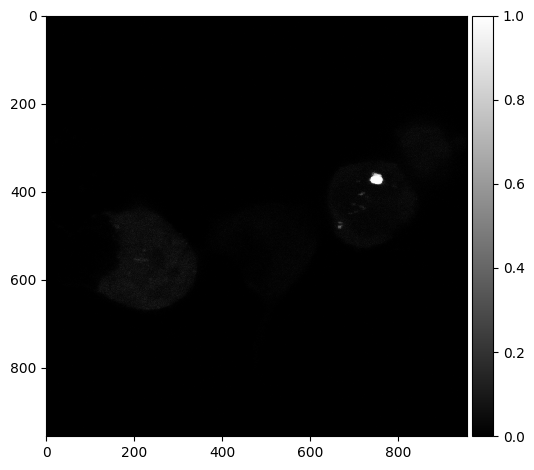

Segmented Cells


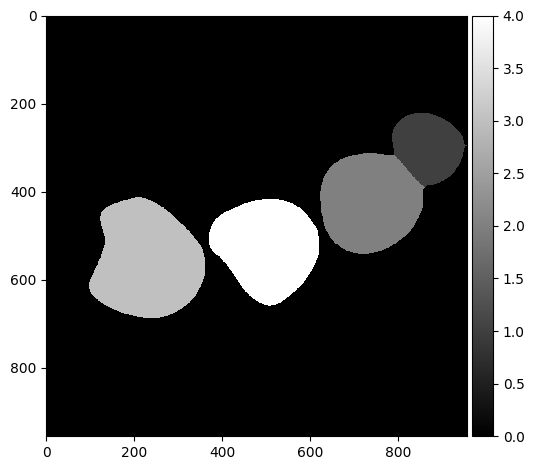

Threshold:  0.5
Bin count 1049


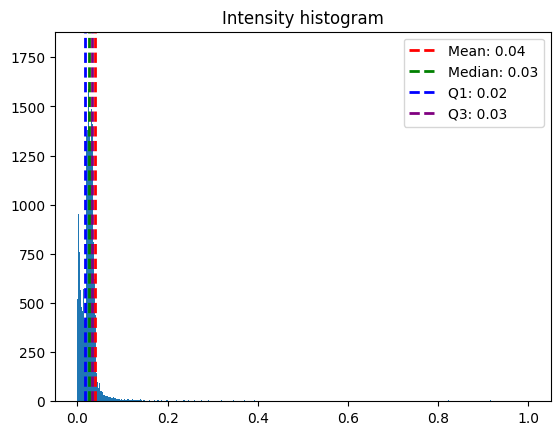

Inclusion Areas:  [541.]


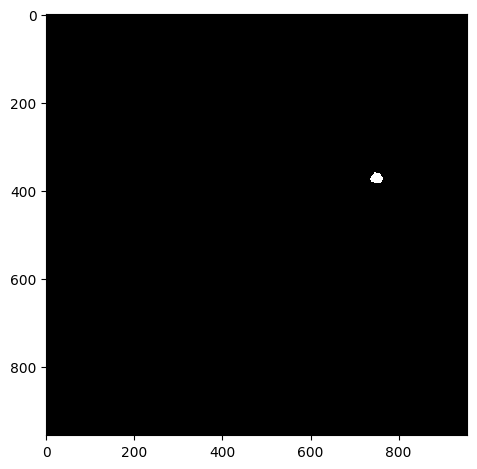

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_01.czi
Green Channel


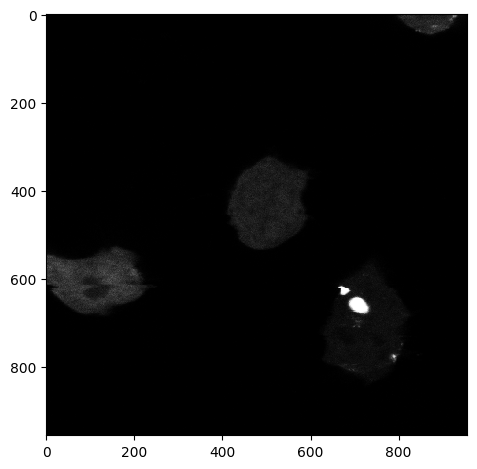

Segmented Cells


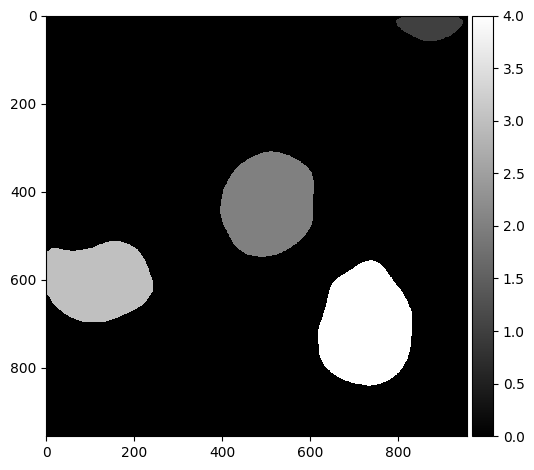

Threshold:  0.5
Bin count 677


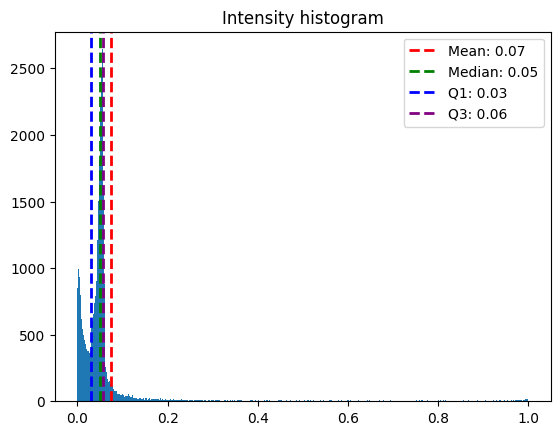

Inclusion Areas:  [ 301. 1231.   40.]


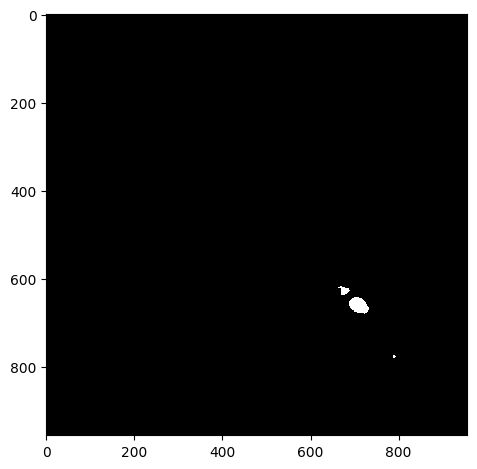

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_02.czi
Green Channel


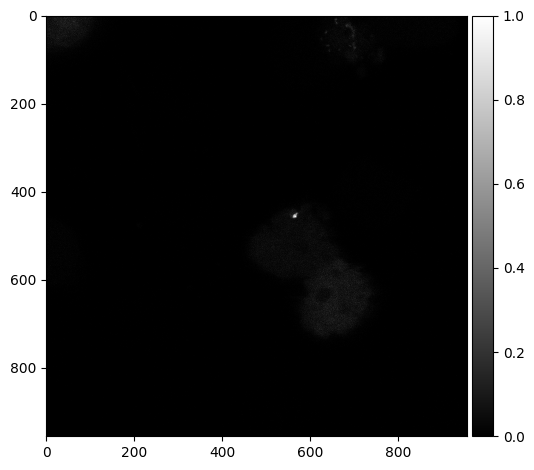

Segmented Cells


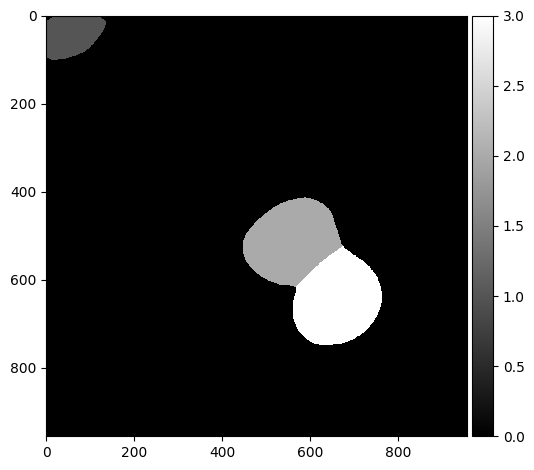

Threshold:  0.5
Bin count 198


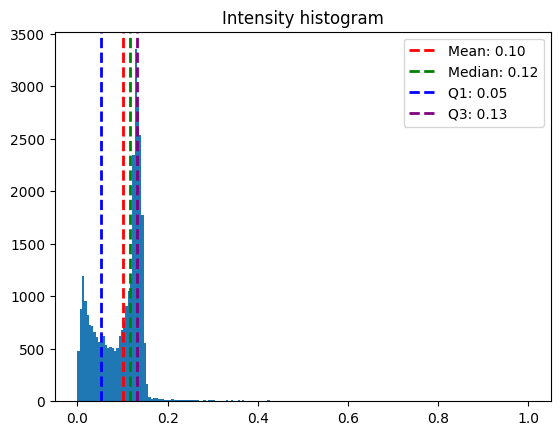

Inclusion Areas:  [43.]


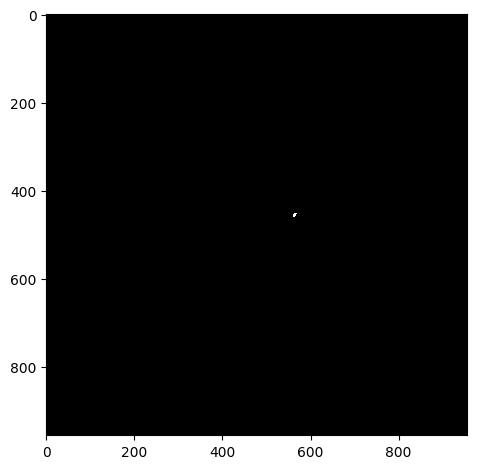

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_03.czi
Green Channel


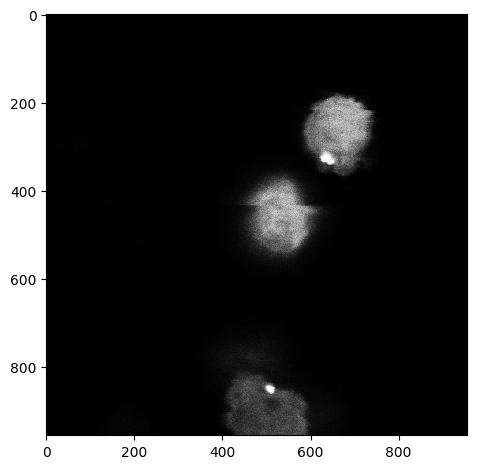

Segmented Cells


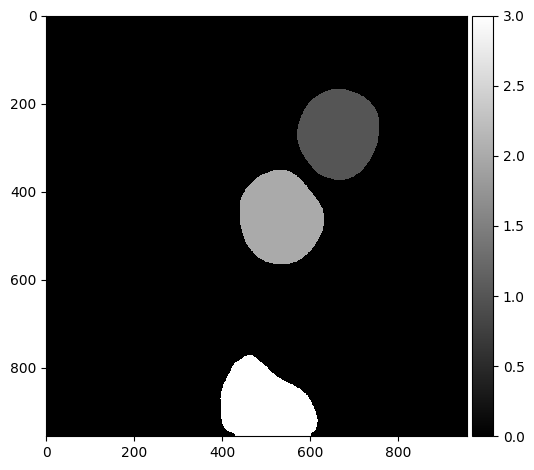

Threshold:  0.99
Bin count 33


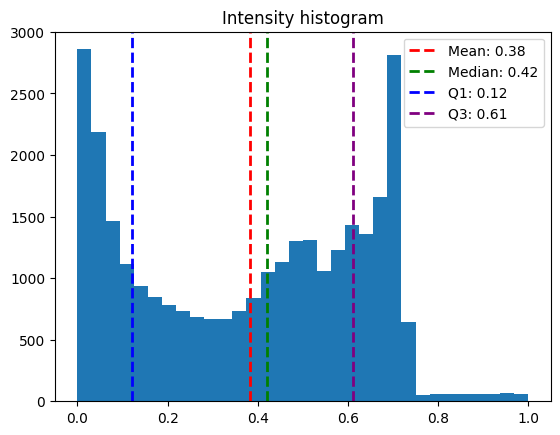

Inclusion Areas:  [153.]


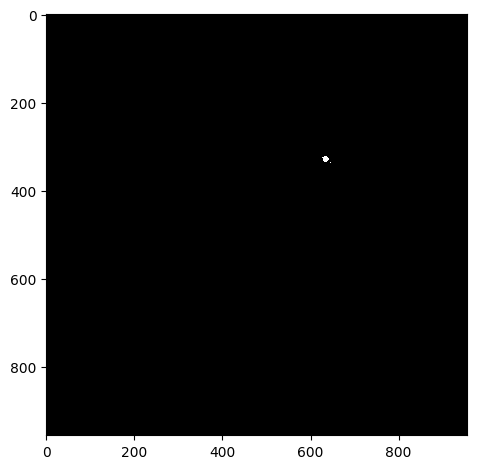

Threshold:  0.5
Bin count 93


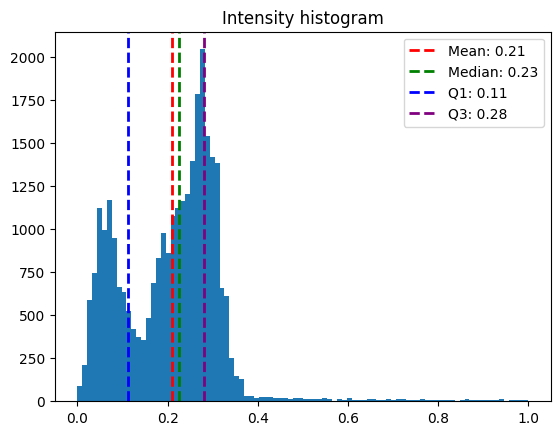

Inclusion Areas:  [356.]


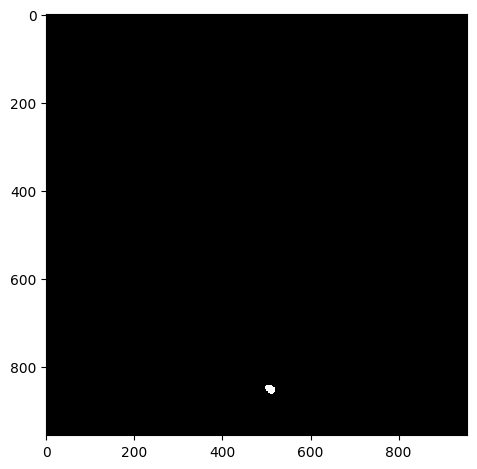

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_04.czi
Green Channel


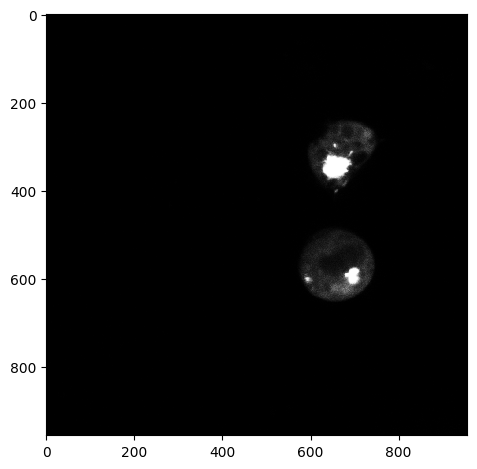

Segmented Cells


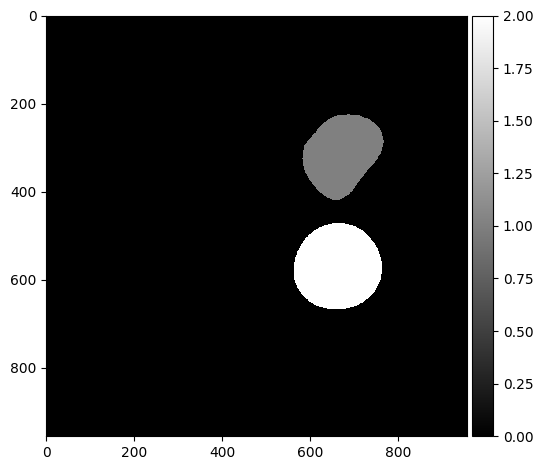

Threshold:  0.5
Bin count 100


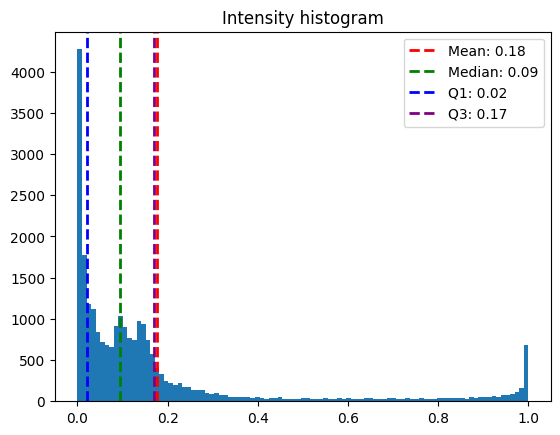

Inclusion Areas:  [  50.   42. 2607.]


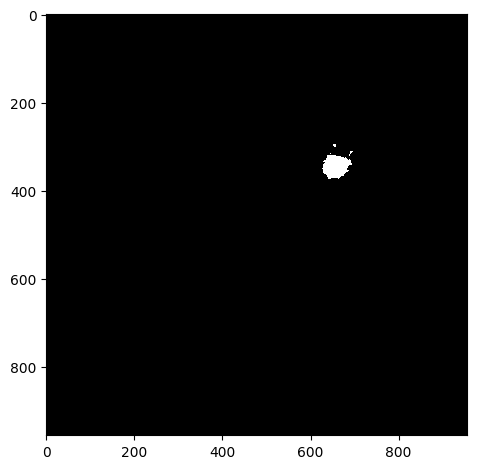

Threshold:  0.5
Bin count 143


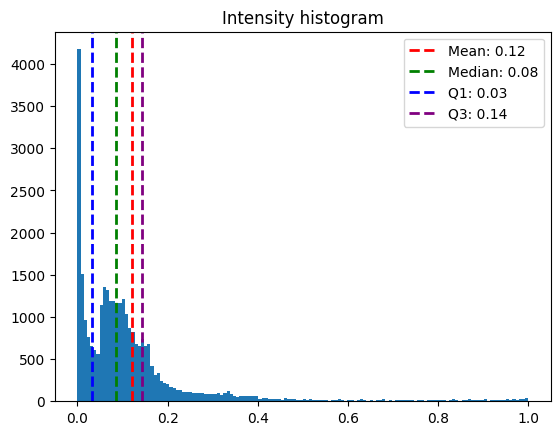

Inclusion Areas:  [1015.   92.]


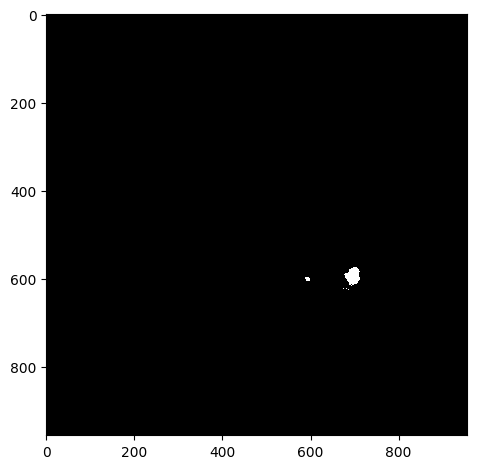

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_05.czi
Green Channel


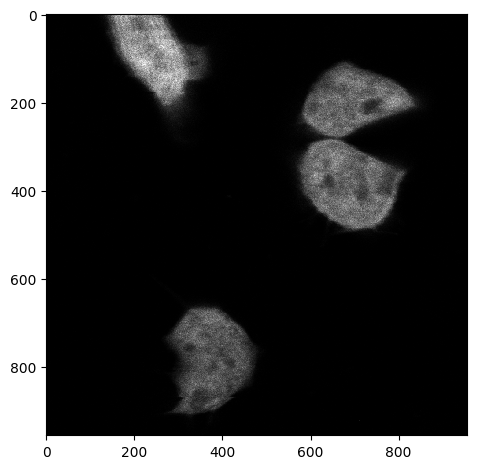

Segmented Cells


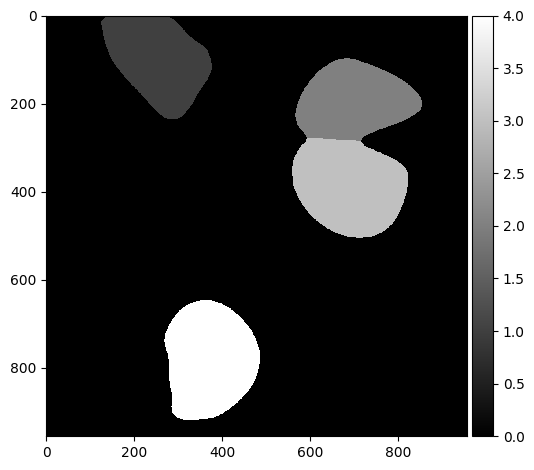

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_06.czi
Green Channel


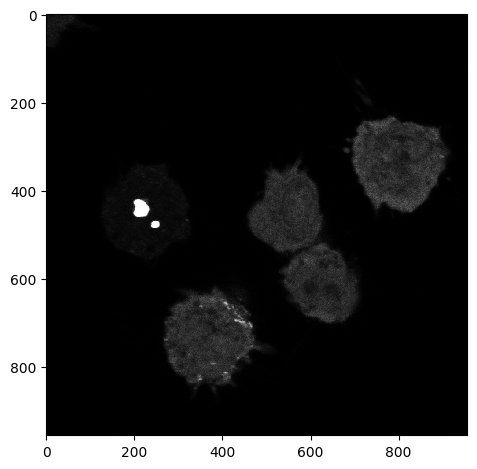

Segmented Cells


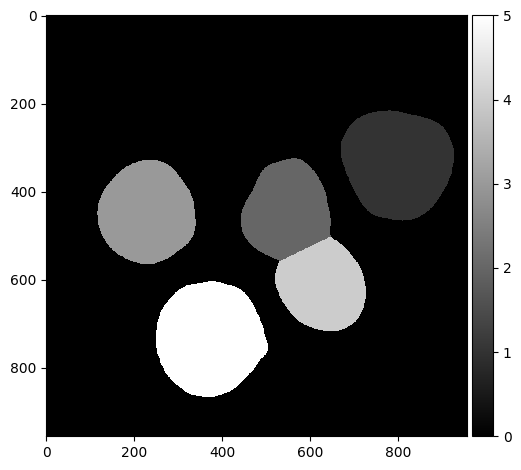

Threshold:  0.5
Bin count 997


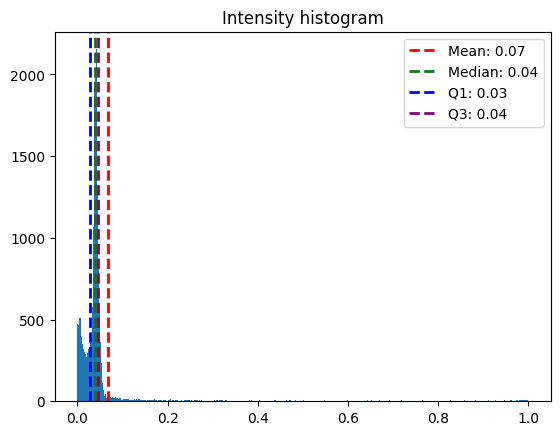

Inclusion Areas:  [1150.  264.]


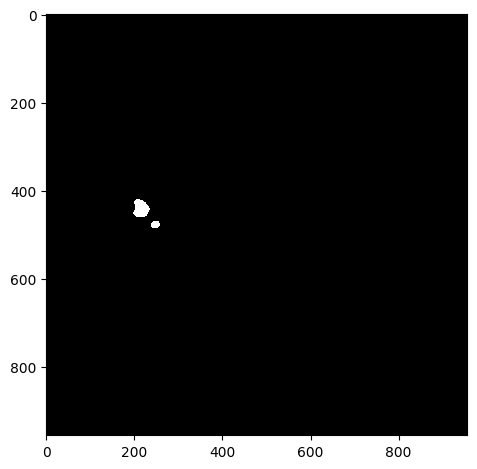

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_07.czi
Green Channel


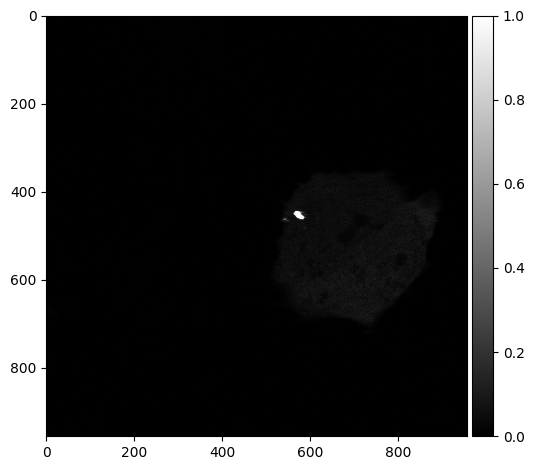

Segmented Cells


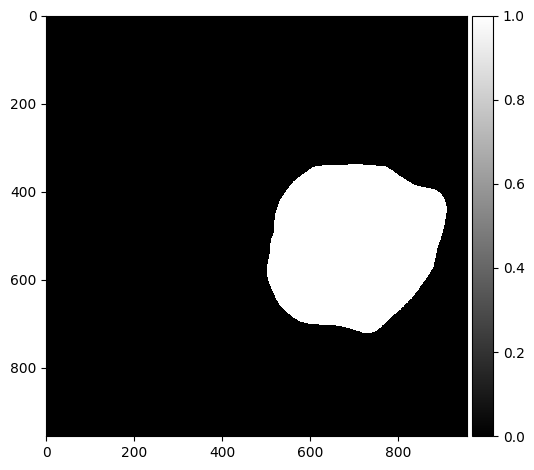

Threshold:  0.5
Bin count 745


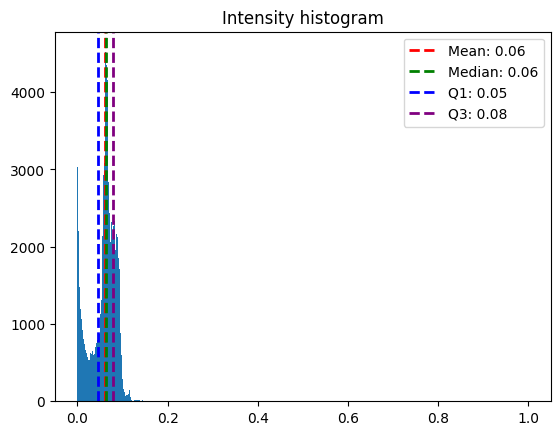

Inclusion Areas:  [286.]


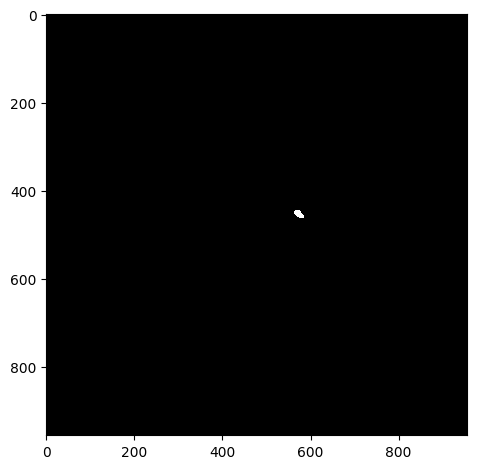

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_08.czi
Green Channel


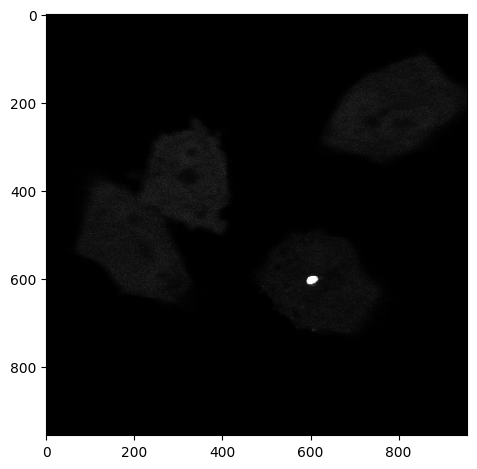

Segmented Cells


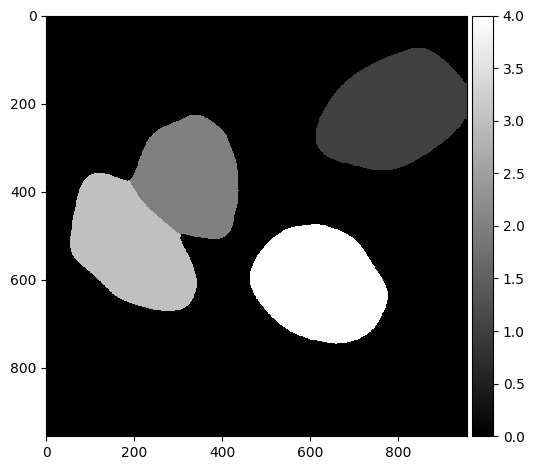

Threshold:  0.5
Bin count 557


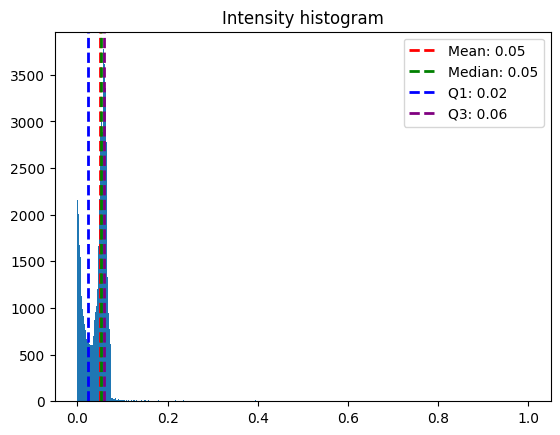

Inclusion Areas:  [373.]


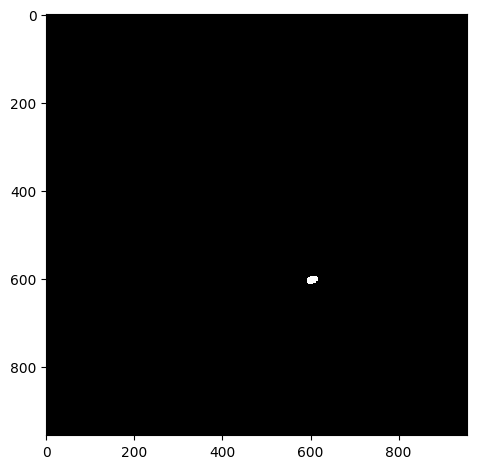

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_09.czi
Green Channel


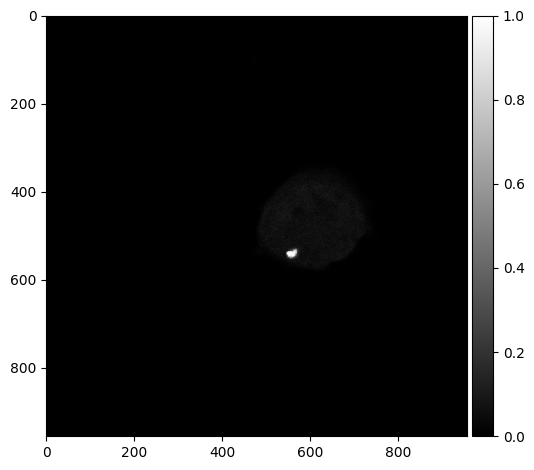

Segmented Cells


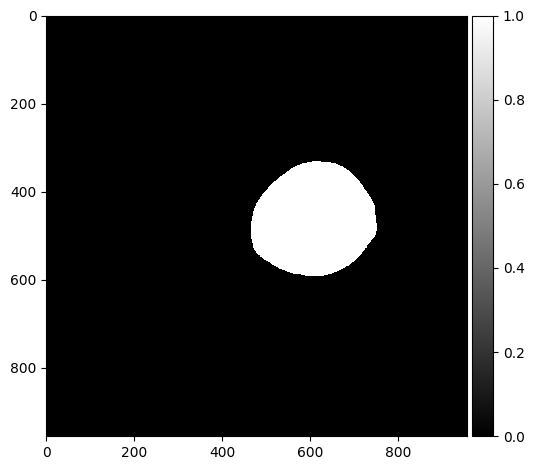

Threshold:  0.5
Bin count 401


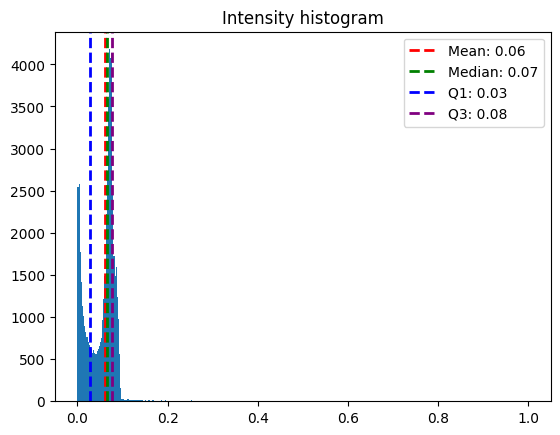

Inclusion Areas:  [308.]


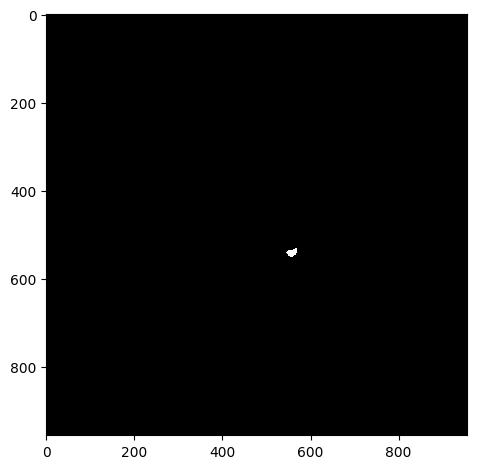

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WT_TAX1BP1_10.czi
Green Channel


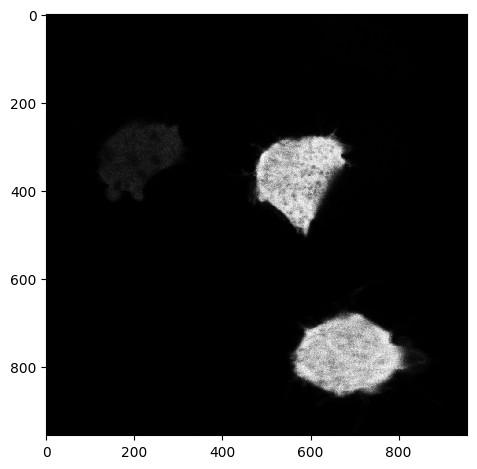

Segmented Cells


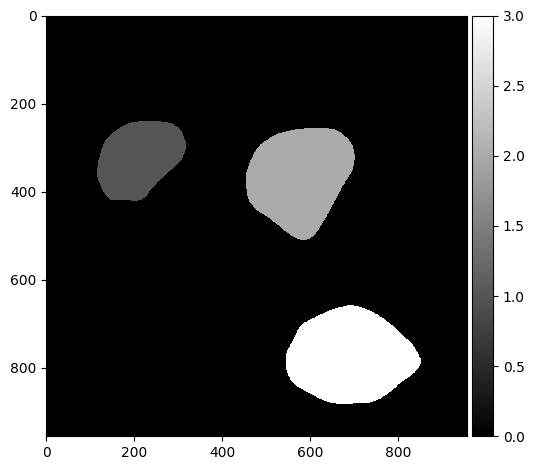

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
analyze_all_images(folders[0])